## Comparing oral fibroblasts from controls to disease predicted oral mucosa fibroblasts Gene Ontology analysis

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter
import gseapy

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

import gseapy

In [2]:
import random

In [3]:
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.0 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3


In [4]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [5]:
gene_set_names = gseapy.get_library_name(organism='Human')
print(gene_set_names)

['ARCHS4_Cell-lines', 'ARCHS4_IDG_Coexp', 'ARCHS4_Kinases_Coexp', 'ARCHS4_TFs_Coexp', 'ARCHS4_Tissues', 'Achilles_fitness_decrease', 'Achilles_fitness_increase', 'Aging_Perturbations_from_GEO_down', 'Aging_Perturbations_from_GEO_up', 'Allen_Brain_Atlas_10x_scRNA_2021', 'Allen_Brain_Atlas_down', 'Allen_Brain_Atlas_up', 'Azimuth_2023', 'Azimuth_Cell_Types_2021', 'BioCarta_2013', 'BioCarta_2015', 'BioCarta_2016', 'BioPlanet_2019', 'BioPlex_2017', 'CCLE_Proteomics_2020', 'CORUM', 'COVID-19_Related_Gene_Sets', 'COVID-19_Related_Gene_Sets_2021', 'Cancer_Cell_Line_Encyclopedia', 'CellMarker_Augmented_2021', 'ChEA_2013', 'ChEA_2015', 'ChEA_2016', 'ChEA_2022', 'Chromosome_Location', 'Chromosome_Location_hg19', 'ClinVar_2019', 'DSigDB', 'Data_Acquisition_Method_Most_Popular_Genes', 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019', 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019', 'Descartes_Cell_Types_and_Tissue_2021', 'Diabetes_Perturbations_GEO_2022', 'DisGeNET', 'Disease_Perturbations_from_GEO

### Import

In [6]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/pooled_compartments/Mes_AP.pooled_healthy_disease.remapped.allgenes.fine_annot.no_doublets.20230418.h5ad')

In [7]:
adata.obs = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/pooled_compartments/Mes_AP.pooled_healthy_disease.remapped.allgenes.fine_annot.no_doublets.20230418.csv',index_col=0)

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (84,102,105,112,113,114,115,117,119) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
adata

AnnData object with n_obs × n_vars = 77050 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [9]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

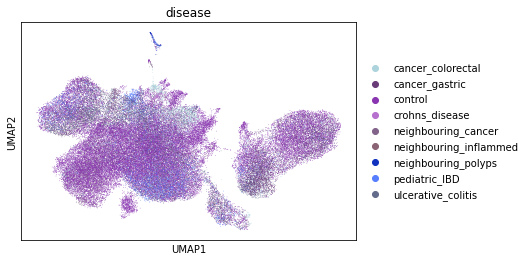

In [10]:
sc.pl.umap(adata,color='disease')

#### Split control and disease for comparison

In [11]:
#Prepare categories for downsampling (per donor_celltype combination)
adata.obs['donor_celltype']=adata.obs['donorID_unified'].astype(str)+'_'+adata.obs['level_3_annot'].astype(str)
adata.obs.donor_celltype.value_counts()

D30_Lamina_propria_fibroblast_ADAMDEC1    2442
D71_Crypt_fibroblast_PI16                 2253
D90_Crypt_fibroblast_PI16                 1911
D29_Lamina_propria_fibroblast_ADAMDEC1    1563
D30_Villus_fibroblast_F3                  1483
                                          ... 
D158_Oral_mucosa_fibroblast                  1
D158_Crypt_fibroblast_PI16                   1
D13_Villus_fibroblast_F3                     1
D13_Follicular_DC                            1
D129_Myofibroblast                           1
Name: donor_celltype, Length: 1038, dtype: int64

In [12]:
control = adata[adata.obs.disease.isin(['control'])].copy()

In [13]:
control

AnnData object with n_obs × n_vars = 49902 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [14]:
disease = adata[~adata.obs.disease.isin(['control'])].copy()

In [15]:
disease

AnnData object with n_obs × n_vars = 27148 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

downsample to 200 cells per cell type per donor

In [16]:
#function for downsampling
def downsample_mask(clustering, to_thin, n_cells=200):
    mask = np.array([i not in to_thin for i in clustering])
    numtemp = np.arange(len(clustering))
    for clus in to_thin:
        inds = set(numtemp[[i==clus for i in clustering]])
        keep = random.sample(inds, round(n_cells))
        mask[keep] = True
    return mask


In [17]:
control.obs.donor_celltype.value_counts()

D30_Lamina_propria_fibroblast_ADAMDEC1    2442
D71_Crypt_fibroblast_PI16                 2253
D90_Crypt_fibroblast_PI16                 1911
D29_Lamina_propria_fibroblast_ADAMDEC1    1563
D30_Villus_fibroblast_F3                  1483
                                          ... 
D30_Oesophagus_fibroblast                    1
D29_Oesophagus_fibroblast                    1
D28_Oral_mucosa_fibroblast                   1
D28_Lamina_propria_fibroblast_ADAMDEC1       1
D158_Crypt_fibroblast_PI16                   1
Name: donor_celltype, Length: 492, dtype: int64

In [18]:
control

AnnData object with n_obs × n_vars = 49902 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [19]:
#Downsample
vc=control.obs.donor_celltype.value_counts().loc[lambda x: x>200].reset_index()['index']
mask_p = downsample_mask(control.obs['donor_celltype'], vc.tolist(), n_cells=200)
control = control[mask_p]
control.obs.donor_celltype.value_counts()

D103_Crypt_fibroblast_PI16                200
D78_Oral_mucosa_fibroblast                200
D95_Lamina_propria_fibroblast_ADAMDEC1    200
D82_Crypt_fibroblast_PI16                 200
D83_Crypt_fibroblast_PI16                 200
                                         ... 
D30_Oesophagus_fibroblast                   1
D29_Oesophagus_fibroblast                   1
D28_Oral_mucosa_fibroblast                  1
D28_Lamina_propria_fibroblast_ADAMDEC1      1
D158_Crypt_fibroblast_PI16                  1
Name: donor_celltype, Length: 492, dtype: int64

In [20]:
control

View of AnnData object with n_obs × n_vars = 25929 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_count

In [21]:
disease

AnnData object with n_obs × n_vars = 27148 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [22]:
#Downsample
vc=disease.obs.donor_celltype.value_counts().loc[lambda x: x>200].reset_index()['index']
mask_p = downsample_mask(disease.obs['donor_celltype'], vc.tolist(), n_cells=200)
disease = disease[mask_p]
disease.obs.donor_celltype.value_counts()

D113_Vascular_smooth_muscle               200
D26_Lamina_propria_fibroblast_ADAMDEC1    200
D148_Villus_fibroblast_F3                 200
D19_Crypt_fibroblast_PI16                 200
D21_Oral_mucosa_fibroblast                200
                                         ... 
D26_Oesophagus_fibroblast                   1
D25_Fibroblast_reticular                    1
D141_Crypt_fibroblast_PI16                  1
D155_Crypt_fibroblast_PI16                  1
D129_Myofibroblast                          1
Name: donor_celltype, Length: 546, dtype: int64

In [23]:
disease

View of AnnData object with n_obs × n_vars = 22430 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_count

### Calculate DEGs for oral mucosa fibroblasts compared to other fibroblasts using scanpy wilcoxon test

Marker genes of control oral mucosa fibroblasts

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


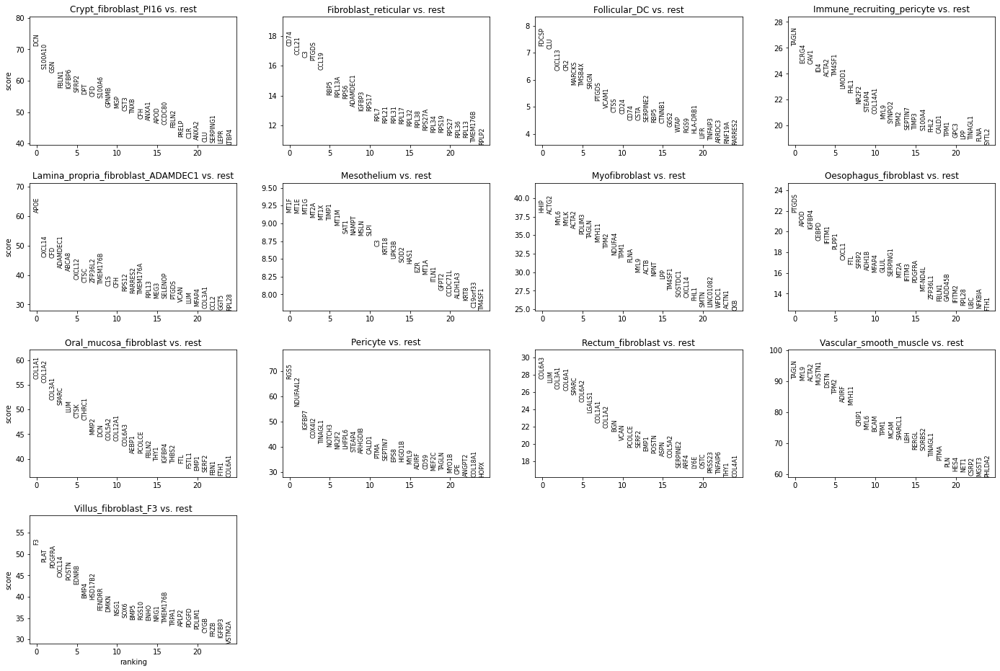

In [24]:
sc.tl.rank_genes_groups(control,groupby='level_3_annot',method='wilcoxon',key_added = "wilcoxon")
sc.pl.rank_genes_groups(control, n_genes=25, sharey=False, key="wilcoxon")

Filter genes and find GO terms
https://nbisweden.github.io/workshop-scRNAseq/labs/compiled/scanpy/scanpy_05_dge.html

In [25]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(control, group='Oral_mucosa_fibroblast', 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

3211


In [26]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2018',
                     cutoff = 0.5)

In [27]:
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,neutrophil mediated immunity (GO:0002446),181/487,2.376912e-30,1.083872e-26,0,0,3.217739,219.487592,CDA;TMEM179B;GMFG;PYCARD;LGALS3;PSMD7;LAMP1;PL...
1,GO_Biological_Process_2018,neutrophil degranulation (GO:0043312),176/479,7.666712e-29,1.748010e-25,0,0,3.155198,204.261470,CDA;TMEM179B;GMFG;PYCARD;LGALS3;PSMD7;LAMP1;PL...
2,GO_Biological_Process_2018,neutrophil activation involved in immune respo...,176/483,2.421485e-28,3.680658e-25,0,0,3.113333,197.970592,CDA;TMEM179B;GMFG;PYCARD;LGALS3;PSMD7;LAMP1;PL...
3,GO_Biological_Process_2018,Golgi vesicle transport (GO:0048193),108/271,2.852711e-21,3.252091e-18,0,0,3.550113,167.941697,KDELR1;PDCD6;GOLGA2;GOLGA3;GOLGA5;TFG;KIFAP3;N...
4,GO_Biological_Process_2018,ER to Golgi vesicle-mediated transport (GO:000...,78/180,3.007722e-18,2.743043e-15,0,0,4.072980,164.325807,ARF4;MCFD2;KDELR1;PDCD6;CTSZ;IER3IP1;GOLGA2;AC...


Explore databases of interest

<AxesSubplot:title={'center':'GO_Biological_Process_2018'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

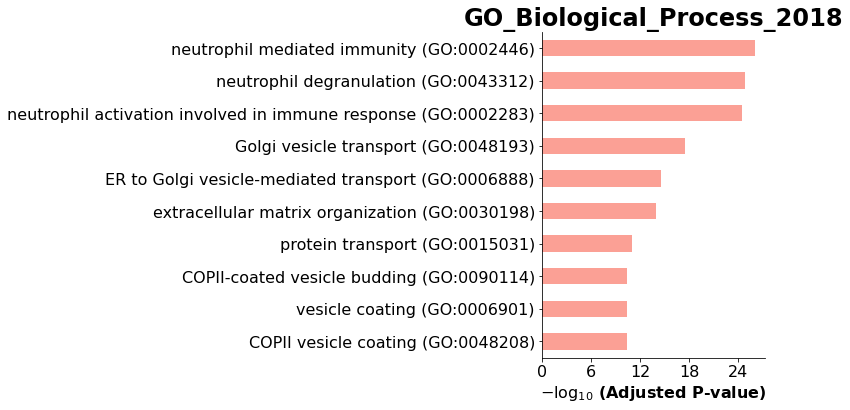

In [28]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2018')

In [29]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2017b',
                     cutoff = 0.5)

<AxesSubplot:title={'center':'GO_Biological_Process_2017b'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

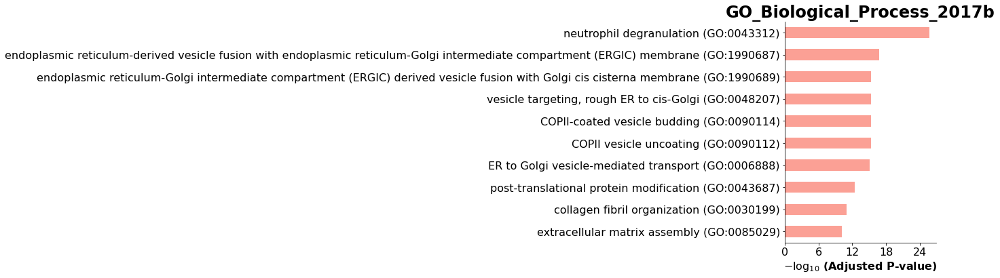

In [30]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2017b')

In [31]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='KEGG_2019_Human',
                     cutoff = 0.5)

<AxesSubplot:title={'center':'KEGG_2019_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

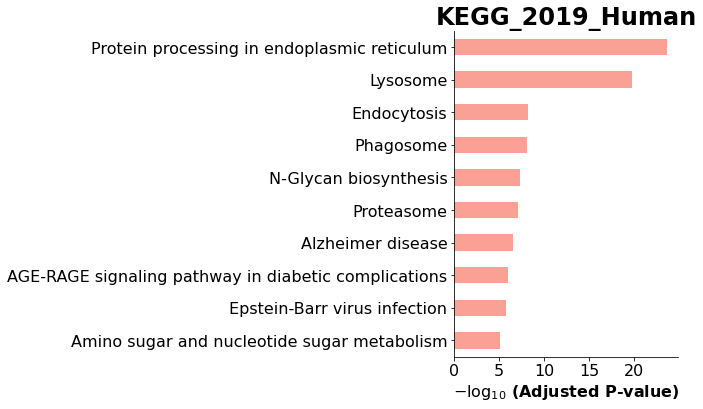

In [32]:
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Human')

In [33]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     cutoff = 0.5)

<AxesSubplot:title={'center':'WikiPathways_2019_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

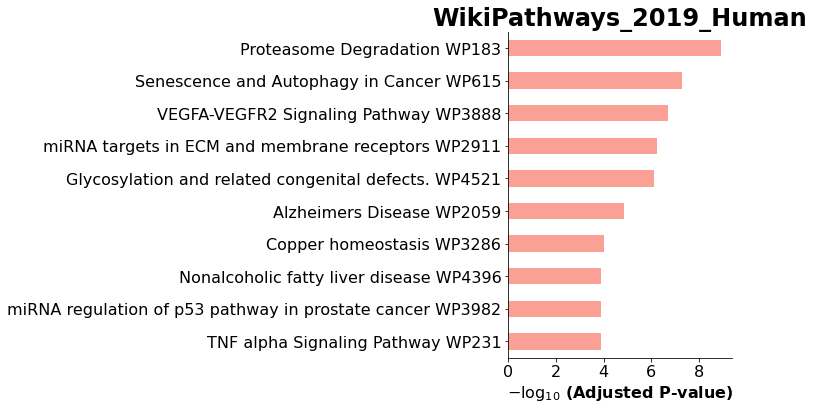

In [34]:
gseapy.barplot(enr_res.res2d,title='WikiPathways_2019_Human')

Marker genes for disease oral mucosa fibroblasts

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


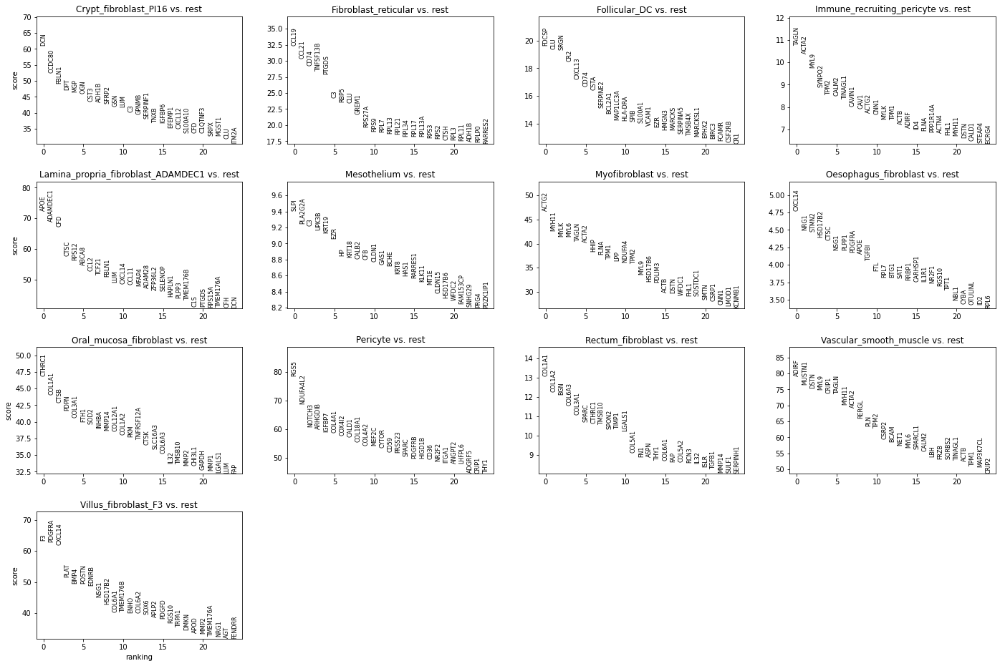

In [35]:
sc.tl.rank_genes_groups(disease,groupby='level_3_annot',method='wilcoxon',key_added = "wilcoxon")
sc.pl.rank_genes_groups(disease, n_genes=25, sharey=False, key="wilcoxon")

In [36]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(disease, group='Oral_mucosa_fibroblast', 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

5018


<AxesSubplot:title={'center':'GO_Biological_Process_2018'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

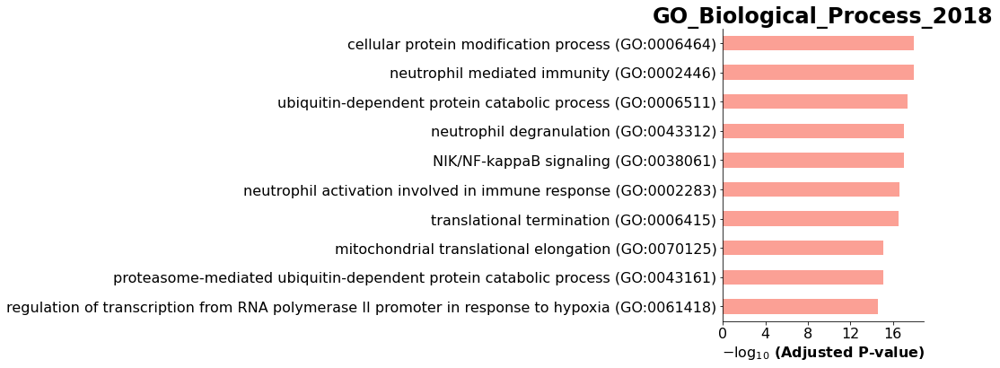

In [37]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2018',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2018')

<AxesSubplot:title={'center':'KEGG_2019_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

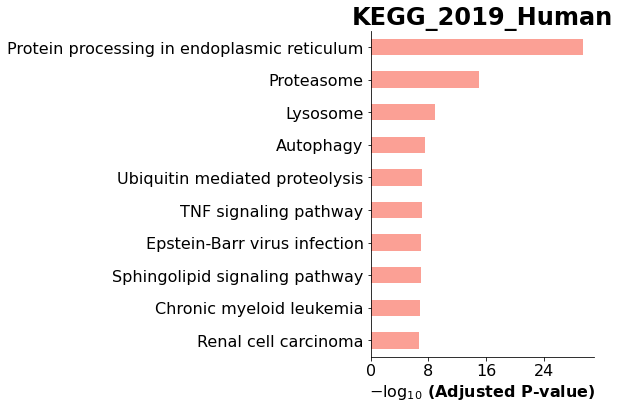

In [38]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='KEGG_2019_Human',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Human')

### Compare oral mucosa fibroblasts directly in control and disease

In [39]:
oral = adata[adata.obs.level_3_annot.isin(['Oral_mucosa_fibroblast'])].copy()

In [40]:
oral

AnnData object with n_obs × n_vars = 6781 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [41]:
sc.pp.neighbors(oral, use_rep="X_scANVI")
sc.tl.umap(oral)

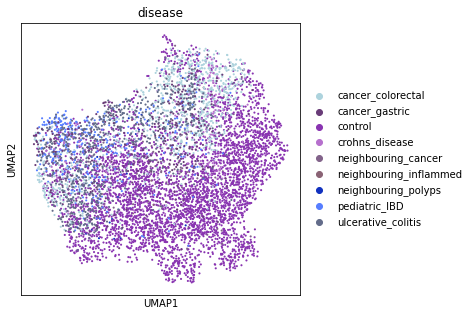

In [42]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(oral,color='disease')

In [43]:
oral.obs['disease'].cat.reorder_categories(['control',

 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD',                               
  'neighbouring_inflammed',
   'neighbouring_polyps',
'cancer_colorectal',
 'cancer_gastric',
'neighbouring_cancer'
   ], inplace=True)


/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


In [44]:
oral

AnnData object with n_obs × n_vars = 6781 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [45]:
del oral.uns['disease_colors']

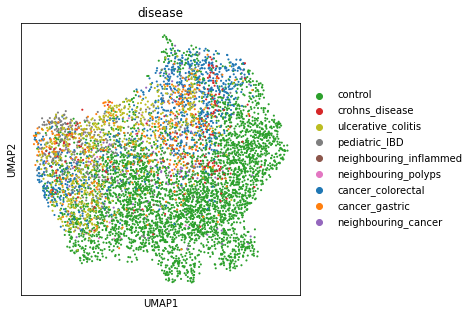

In [46]:
sc.pl.umap(oral,color='disease')

In [47]:
del oral.uns['organ_unified_colors']

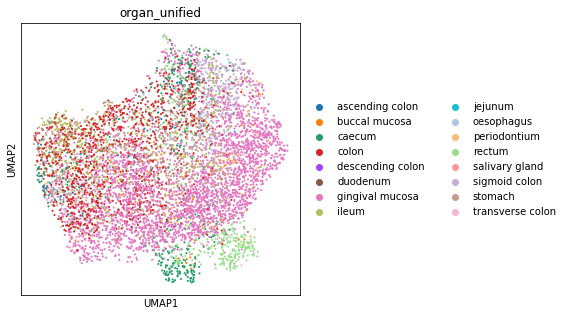

In [48]:
sc.pl.umap(oral,color='organ_unified')

In [49]:
oral.obs.disease.value_counts()

control                   4146
cancer_colorectal          866
ulcerative_colitis         673
pediatric_IBD              377
cancer_gastric             305
neighbouring_cancer        200
crohns_disease             182
neighbouring_polyps         25
neighbouring_inflammed       7
Name: disease, dtype: int64

In [50]:
list(oral.obs.disease.unique())

['control',
 'neighbouring_cancer',
 'neighbouring_polyps',
 'neighbouring_inflammed',
 'pediatric_IBD',
 'cancer_colorectal',
 'ulcerative_colitis',
 'crohns_disease',
 'cancer_gastric']

In [51]:
oral.obs['reference_vs_query'] = (oral.obs["disease"].map(lambda x: {
 'control':'reference',
 'neighbouring_cancer':'reference',
 'neighbouring_polyps':'reference',
 'neighbouring_inflammed':'reference',
 'pediatric_IBD':'query',
 'cancer_colorectal':'query',
 'ulcerative_colitis':'query',
 'crohns_disease':'query',
 'cancer_gastric':'query'
        
         }.get(x, x)).astype("category"))

In [52]:
oral.obs['reference_vs_query'].value_counts()

reference    4378
query        2403
Name: reference_vs_query, dtype: int64

In [53]:
#Downsample
vc=oral.obs.donor_celltype.value_counts().loc[lambda x: x>200].reset_index()['index']
mask_p = downsample_mask(oral.obs['donor_celltype'], vc.tolist(), n_cells=200)
oral = oral[mask_p]
oral.obs.donor_celltype.value_counts()

D82_Oral_mucosa_fibroblast     200
D90_Oral_mucosa_fibroblast     200
D21_Oral_mucosa_fibroblast     200
D78_Oral_mucosa_fibroblast     200
D19_Oral_mucosa_fibroblast     200
                              ... 
D69_Oral_mucosa_fibroblast       1
D98_Oral_mucosa_fibroblast       1
D125_Oral_mucosa_fibroblast      1
D123_Oral_mucosa_fibroblast      1
D1_Oral_mucosa_fibroblast        1
Name: donor_celltype, Length: 115, dtype: int64

In [54]:
oral.obs['reference_vs_query'].value_counts()

reference    3025
query        2188
Name: reference_vs_query, dtype: int64

#### Calculate DEGs between control and disease using scanpy wilcoxon test

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


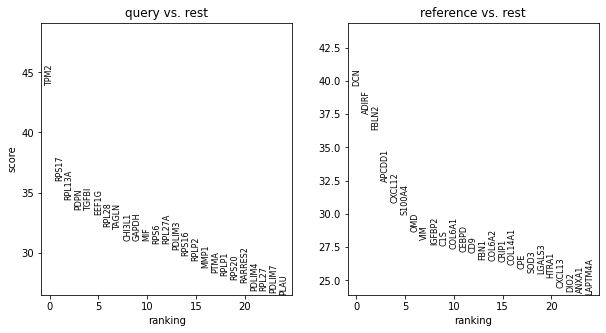

In [55]:
sc.tl.rank_genes_groups(oral,groupby='reference_vs_query',method='wilcoxon',key_added = "wilcoxon")
sc.pl.rank_genes_groups(oral, n_genes=25, sharey=False, key="wilcoxon")

In [56]:
#?gseapy.enrichr
glist = sc.get.rank_genes_groups_df(oral, group='query', 
                                    key='wilcoxon', log2fc_min=0.25, 
                                    pval_cutoff=0.05)['names'].squeeze().str.strip().tolist()
print(len(glist))

3263


In [57]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2018',
                     cutoff = 0.5)

In [58]:
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2018,translation (GO:0006412),161/232,2.243647e-73,1.031629e-69,0,0,12.183080,2037.993116,RPL4;RPL5;RPL3;VARS;RPL32;RPL31;RPL8;APEH;RPL1...
1,GO_Biological_Process_2018,ribosome biogenesis (GO:0042254),145/226,2.806318e-59,6.451724e-56,0,0,9.562635,1289.240656,RPL4;RPL5;RPL3;RPL32;RPL31;RPP30;RRP1;RPL8;NOC...
2,GO_Biological_Process_2018,peptide biosynthetic process (GO:0043043),123/174,1.123758e-57,1.722346e-54,0,0,12.816148,1680.590149,RPL4;RPL5;RPL3;RPL32;RPL31;RPL8;RPL10A;YARS2;R...
3,GO_Biological_Process_2018,rRNA metabolic process (GO:0016072),128/200,3.030988e-52,3.484120e-49,0,0,9.450292,1121.046004,TRIR;RPL4;RPL5;RPL3;RPL32;RPL31;RPP30;RRP1;RPL...
4,GO_Biological_Process_2018,rRNA processing (GO:0006364),128/202,1.619394e-51,1.489195e-48,0,0,9.193776,1075.210101,RPL4;RPL5;RPL3;RPL32;RPL31;RPP30;RRP1;RPL8;RPL...


<AxesSubplot:title={'center':'GO_Biological_Process_2018'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

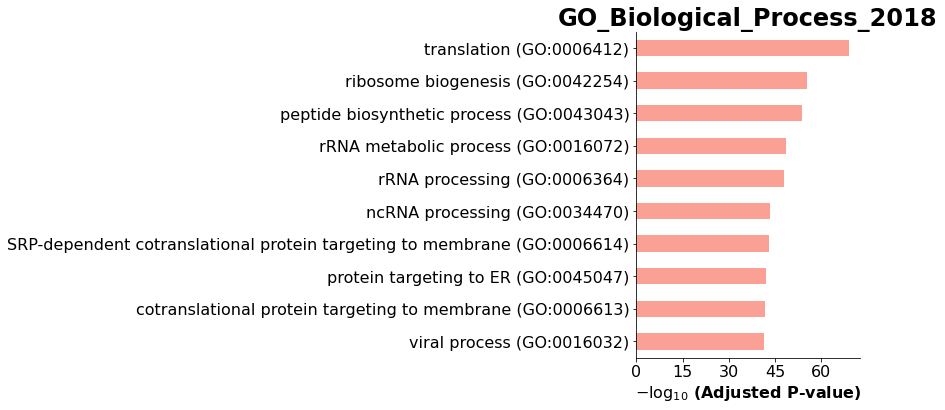

In [59]:
gseapy.barplot(enr_res.res2d,title='GO_Biological_Process_2018')

<AxesSubplot:title={'center':'KEGG_2019_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

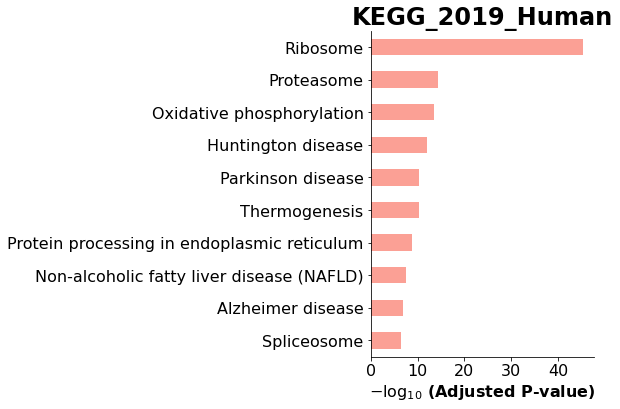

In [60]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='KEGG_2019_Human',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Human')

<AxesSubplot:title={'center':'WikiPathways_2019_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

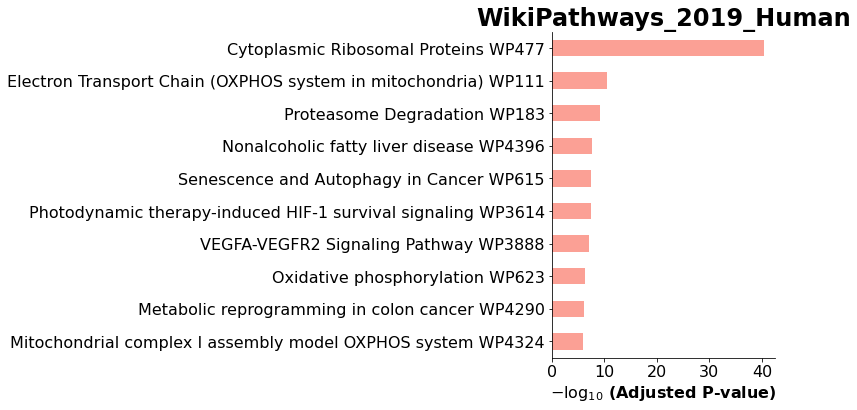

In [61]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='WikiPathways_2019_Human',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='WikiPathways_2019_Human')

<AxesSubplot:title={'center':'GO_Cellular_Component_2021'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

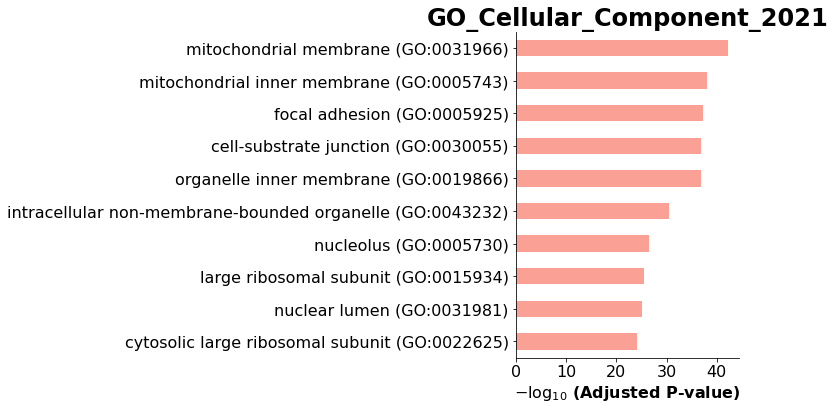

In [62]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Cellular_Component_2021',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='GO_Cellular_Component_2021')

<AxesSubplot:title={'center':'HDSigDB_Human_2021'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

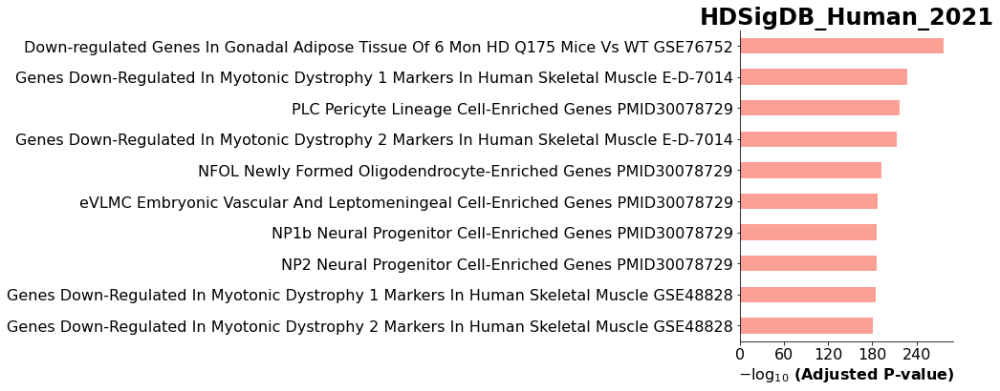

In [63]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='HDSigDB_Human_2021',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='HDSigDB_Human_2021')

<AxesSubplot:title={'center':'GO_Molecular_Function_2018'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

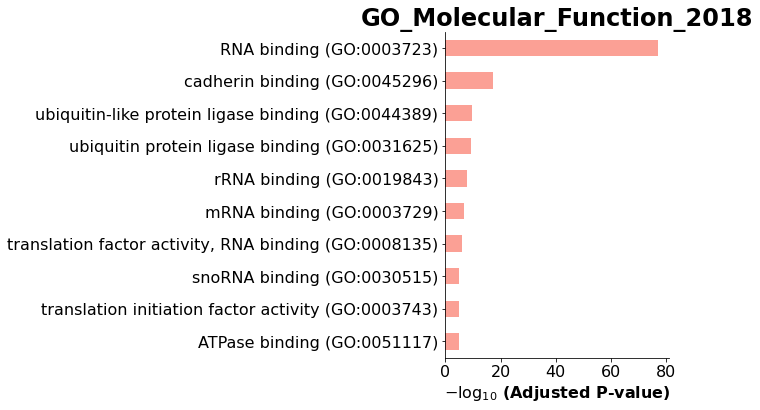

In [64]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='GO_Molecular_Function_2018',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='GO_Molecular_Function_2018')

<AxesSubplot:title={'center':'KEGG_2021_Human'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

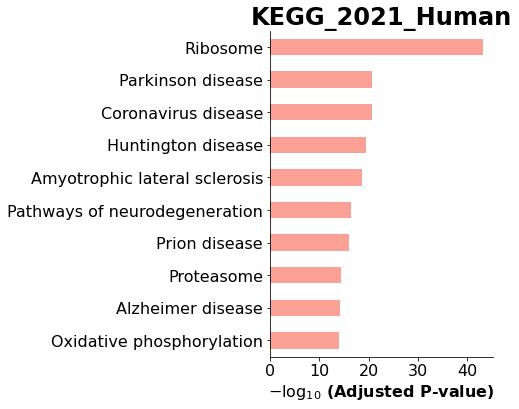

In [65]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='KEGG_2021_Human',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='KEGG_2021_Human')

<AxesSubplot:title={'center':'RNA-Seq_Disease_Gene_and_Drug_Signatures_from_GEO'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

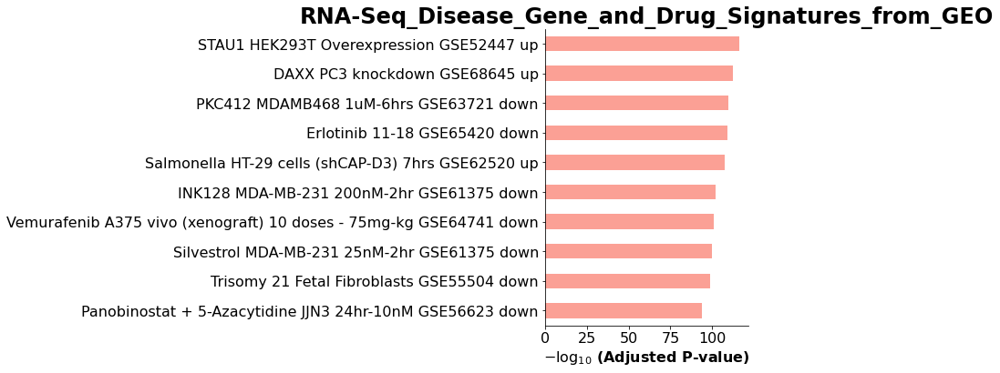

In [66]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='RNA-Seq_Disease_Gene_and_Drug_Signatures_from_GEO',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='RNA-Seq_Disease_Gene_and_Drug_Signatures_from_GEO')

<AxesSubplot:title={'center':'Reactome_2016'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

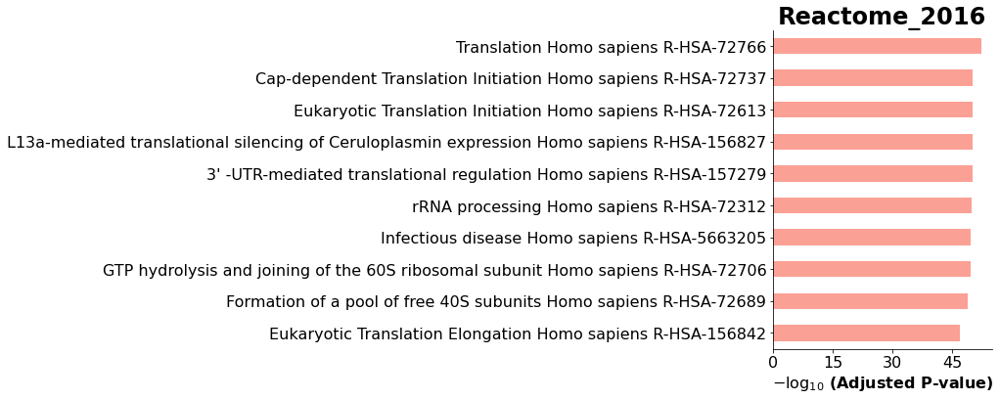

In [67]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='Reactome_2016',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='Reactome_2016')

<AxesSubplot:title={'center':'Reactome_2022'}, xlabel='$- \\log_{10}$ (Adjusted P-value)'>

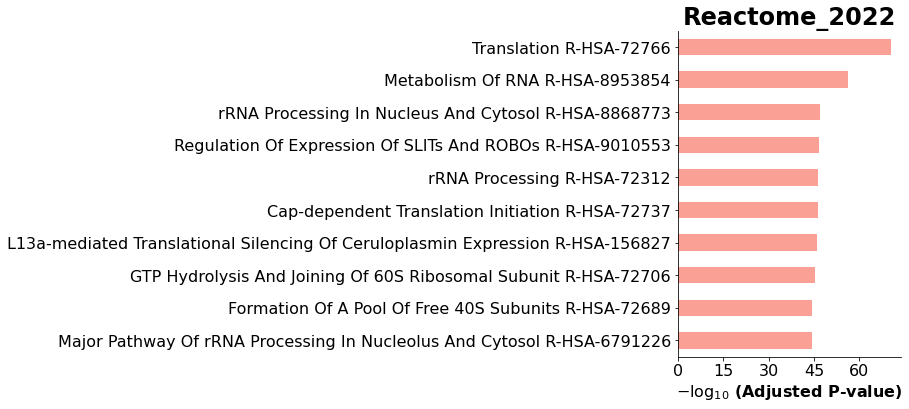

In [68]:
enr_res = gseapy.enrichr(gene_list=glist,
                     organism='Human',
                     gene_sets='Reactome_2022',
                     cutoff = 0.5)
gseapy.barplot(enr_res.res2d,title='Reactome_2022',topterm=15)

In [69]:
from gseapy import barplot, dotplot

better plotting functions
https://github.com/zqfang/GSEApy/blob/master/docs/gseapy_example.ipynb

In [70]:
enr_res.results.head()

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,Reactome_2022,Translation R-HSA-72766,181/281,2.796049e-74,4.585521e-71,0,0,9.770594,1654.777946,RPL4;EIF4A1;RPL5;SRP19;RPL3;RPL32;RPL31;RPL8;A...
1,Reactome_2022,Metabolism Of RNA R-HSA-8953854,283/666,6.940951e-60,5.691580e-57,0,0,4.055042,552.368403,RPL4;RPL5;EIF4A1;POP7;RPL3;RPL32;RPL31;CCNH;EI...
2,Reactome_2022,rRNA Processing In Nucleus And Cytosol R-HSA-8...,122/189,1.916772e-50,1.047835e-47,0,0,9.663906,1106.310533,RPL4;RPL5;RPL3;RPL32;RPL31;RPP30;RPL10A;RPL8;R...
3,Reactome_2022,Regulation Of Expression Of SLITs And ROBOs R-...,113/167,5.768455e-50,2.365067e-47,0,0,11.082769,1256.529438,RPL4;RPL5;RPL3;RPL32;RPL31;EIF4A3;RPL10A;RPL8;...
4,Reactome_2022,rRNA Processing R-HSA-72312,125/199,1.030635e-49,3.380484e-47,0,0,8.969713,1011.752183,RPL4;RPL5;RPL3;RPL32;RPL31;RPP30;RPL8;RPL10A;R...


In [71]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020','KEGG_2021_Human','GO_Biological_Process_2018'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

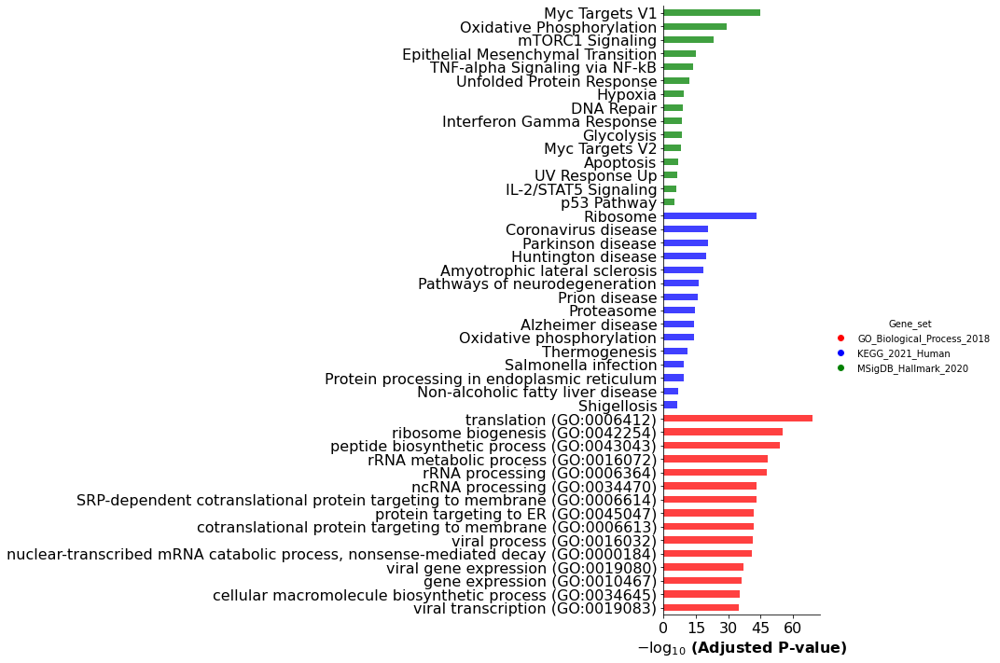

In [72]:
# categorical scatterplot
ax = barplot(enr.results, 
              column="Adjusted P-value", 
              group='Gene_set', # set group, so you could do a multi-sample/library comparsion
              size=10, 
              top_term=15,
              figsize=(3,12), 
              color=['red', 'blue','green'] # set colors for group
             )

In [73]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['KEGG_2021_Human'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

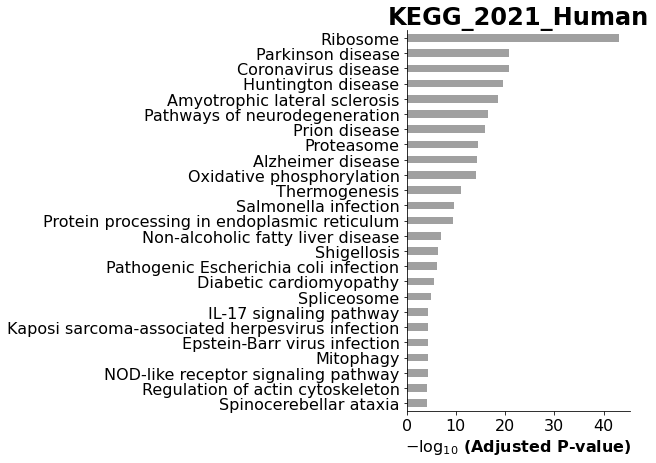

In [74]:
ax = barplot(enr.res2d,title='KEGG_2021_Human', figsize=(4, 7), color='grey',top_term=25)

In [75]:
#Save figure - Extended data 4h
ax.figure.savefig('KEGG_2021_Human_top25_oralmucosaFibro_disease_vs_healthy.pdf',bbox_inches='tight')

In [76]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

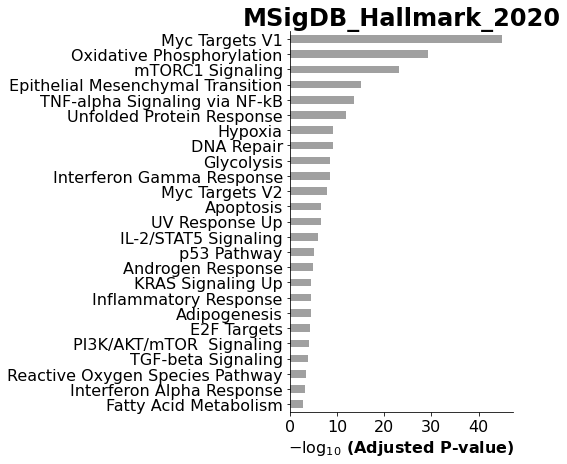

In [77]:
ax = barplot(enr.res2d,title='MSigDB_Hallmark_2020', figsize=(4, 7), color='grey',top_term=25)

In [78]:
#Save figure - Extended data 4h
ax.figure.savefig('MSIGDB_Hallmark_top25_oralmucosaFibro_disease_vs_healthy.pdf',bbox_inches='tight')

In [79]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['GO_Biological_Process_2018'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

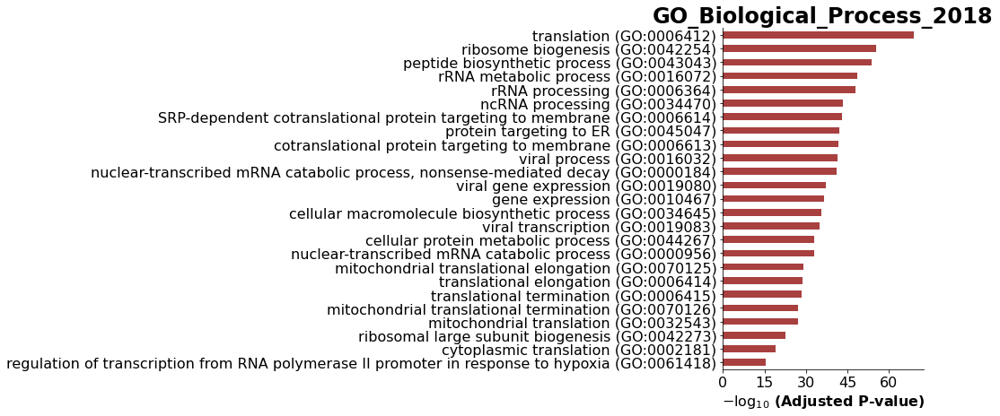

In [80]:
ax = barplot(enr.res2d,title='GO_Biological_Process_2018', figsize=(4, 7), color='darkred',top_term=25)

In [81]:
from gseapy import gseaplot, heatmap

In [82]:
enr

In [83]:
pd.options.display.max_colwidth = 1000

In [84]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['MSigDB_Hallmark_2020'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

In [85]:
enr.results.head(26)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Myc Targets V1,123/200,1.738785e-47,8.693923e-46,0,0,8.475391,912.531035,EIF4A1;HDDC2;PWP1;PHB2;RPL6;UBE2L3;RRP9;PSMD8;EEF1B2;FBL;PSMD7;SNRPD2;TRIM28;SNRPD1;RUVBL2;PSMD3;SNRPD3;KPNA2;RPS10;SMARCC1;RPS5;RPL22;RPS6;UBE2E1;TUFM;VDAC3;SRSF2;SNRPG;NHP2;SRSF3;VDAC1;ERH;HPRT1;PPIA;KPNB1;PSMD14;PHB;LDHA;PGK1;NOP16;CBX3;GOT2;PA2G4;MRPL23;EIF2S2;EIF2S1;SRPK1;LSM2;AIMP2;COPS5;CDK4;UBA2;RNPS1;HNRNPC;YWHAE;SLC25A3;MCM7;RPLP0;YWHAQ;C1QBP;RACK1;DHX15;MRPL9;ACP1;CCT3;CCT2;RFC4;VBP1;NCBP2;CTPS1;NME1;PSMA6;PSMA4;PSMA1;PSMA2;TCP1;SNRPA1;ETF1;PABPC1;PRPS2;HDAC2;PCNA;SRSF1;DDX21;TYMS;COX5A;PSMA7;HSPD1;PPM1G;PSMB2;PSMB3;RPS3;RPL14;EIF4H;SNRPB2;RPS2;BUB3;RPL18;CCT7;HNRNPA1;CCT5;CCT4;NOP56;RANBP1;NPM1;RRM1;SSB;PTGES3;NAP1L1;DEK;HSPE1;RSL1D1;PSMC6;PSMC4;APEX1;SERBP1;NDUFAB1;EIF3J;SSBP1;TARDBP;ABCE1;EIF3D;RAN
1,MSigDB_Hallmark_2020,Oxidative Phosphorylation,104/200,1.765191e-31,4.412977e-30,0,0,5.706790,404.108532,ACAA2;PHB2;TOMM22;ATP6V1E1;PDHX;ATP6V1G1;ATP6V0E1;SDHC;ATP1B1;SDHB;COX6B1;OXA1L;COX7A2L;UQCRC1;VDAC3;VDAC2;VDAC1;ISCU;UQCRB;COX17;ATP5MC2;ATP5MC3;HTRA2;COX7A2;MRPL15;UQCRH;MRPL11;TIMM50;LDHB;LDHA;RHOT2;RHOT1;GRPEL1;ATP6V1H;NDUFV2;ATP6V1D;ATP5MG;ATP6V1C1;ATP5MF;ATP6V1F;ATP5ME;HSPA9;GOT2;UQCRQ;CYCS;GPI;COX7B;MRPS15;SLC25A3;ACADVL;ALAS1;MRPS11;COX4I1;MRPS12;HCCS;ETFA;TCIRG1;COX7C;IDH3B;TIMM17A;UQCRFS1;IDH3A;COX8A;ATP6V0B;MRPS22;NDUFC2;HADHB;NDUFS8;NDUFS6;NDUFS2;SLC25A5;ATP6V0C;SLC25A11;SLC25A6;ECHS1;NDUFB7;TIMM9;NDUFB4;TIMM13;NDUFB1;UQCR11;TIMM10;PDHB;COX5A;HSD17B10;ATP5F1A;NDUFA9;TIMM8B;NDUFA8;NDUFA7;MDH1;ATP5PB;MTX2;MDH2;NDUFA4;IDH3G;NDUFA3;NDUFA2;ATP5F1C;ATP5F1D;ATP5F1E;NDUFAB1;ATP5PO;BAX
2,MSigDB_Hallmark_2020,mTORC1 Signaling,95/200,5.179260e-25,8.632100e-24,0,0,4.750000,265.619835,ERO1A;GPI;TES;TFRC;UBE2D3;ARPC5L;SLC2A1;ATP2A2;PLOD2;ENO1;IFI30;RRP9;FADS2;PNP;TBK1;SERP1;NAMPT;CTSC;PGM1;MAP2K3;ACTR3;ACTR2;G6PD;TPI1;CACYBP;TUBG1;SYTL2;ACLY;PSMA3;DDX39A;PSMA4;MTHFD2;PPA1;PSME3;DDIT4;MTHFD2L;HMBS;ETF1;HPRT1;EEF1E1;BCAT1;SQSTM1;PPIA;GAPDH;SKAP2;RAB1A;TOMM40;PSMD14;STC1;CXCR4;AK4;GLRX;SLC1A5;HSP90B1;HSPD1;SLC9A3R1;STIP1;LDHA;RDH11;SERPINH1;PGK1;LTA4H;ABCF2;YKT6;LDLR;ATP6V1D;SEC11A;HSPA9;CYB5B;EGLN3;SDF2L1;HSPA5;GOT1;PNO1;SRD5A1;EDEM1;M6PR;EIF2S2;HSPE1;MLLT11;CCT6A;SQLE;RIT1;GCLC;PFKL;PSMC6;COPS5;PSMC4;SCD;PSMC2;CCNG1;BHLHE40;PSMG1;CALR;NFKBIB
3,MSigDB_Hallmark_2020,Epithelial Mesenchymal Transition,82/200,6.287184e-17,7.858980e-16,0,0,3.630555,135.439441,ITGB1;CXCL6;CXCL8;MCM7;ELN;SERPINE1;TNC;TNFAIP3;PLOD2;CXCL1;PLOD1;ENO2;AREG;FGF2;SAT1;PVR;MYLK;LOXL2;RGS4;GJA1;GLIPR1;LGALS1;SGCD;CDH2;BASP1;DPYSL3;TIMP3;QSOX1;ITGAV;CCN2;TIMP1;CCN1;COLGALT1;TGM2;TNFRSF12A;TPM4;MMP1;IGFBP3;TPM2;ITGA2;TPM1;MMP3;BGN;PLAUR;GREM1;ACTA2;SFRP4;MMP14;ADAM12;CDH11;ITGA5;MYL9;CD44;PFN2;FBN2;TAGLN;NNMT;TNFRSF11B;NID2;THBS1;PTHLH;FSTL3;GPC1;SERPINH1;FLNA;SPOCK1;CD59;PDLIM4;IL32;VCAM1;TGFB1;BDNF;TFPI2;FZD8;INHBA;VEGFA;IL6;BMP1;FAP;COL7A1;TGFBI;FERMT2
4,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,79/200,2.818811e-15,2.818811e-14,0,0,3.407181,114.148933,CXCL6;TNFAIP8;CSF2;SERPINE1;TNC;TNFAIP3;CXCL1;CXCL3;AREG;SAT1;SLC2A6;ETS2;ICAM1;PANX1;CCND1;PLAU;ZC3H12A;NAMPT;PDE4B;CCN1;PHLDA2;PHLDA1;IER3;DUSP4;MAP2K3;KDM6B;KLF10;TGIF1;DUSP5;TSC22D1;RIPK2;SPHK1;PLAUR;TAP1;F3;SERPINB8;IL1B;TRIB1;FJX1;SQSTM1;CD44;BIRC3;B4GALT5;PFKFB3;BCL2A1;PTGS2;RELB;DRAM1;MSC;PDLIM5;LDLR;MCL1;ABCA1;EGR3;GCH1;TIPARP;CCL20;PLK2;G0S2;INHBA;ATP2B1;SOD2;VEGFA;FOSL1;EHD1;NFKBIA;RCAN1;CXCL10;PTPRE;SPSB1;IL6;KLF6;TNIP1;TNIP2;CLCF1;BHLHE40;NFKBIE;IL7R;NFE2L2
5,MSigDB_Hallmark_2020,Unfolded Protein Response,52/113,1.237488e-13,1.031240e-12,0,0,4.427159,131.577469,ERO1A;EIF4A1;EIF4A3;RRP9;CKS1B;RPS14;SERP1;KHSRP;KIF5B;BANF1;IMP3;PDIA6;PDIA5;ARFGAP1;MTHFD2;DKC1;DDIT4;NHP2;PREB;ATP6V0D1;ATF4;SHC1;GOSR2;PARN;CXXC1;SDAD1;HSP90B1;EXOSC5;EXOSC4;EIF4EBP1;DNAJB9;SEC11A;EXOSC1;PAIP1;HSPA9;NOP56;ZBTB17;NPM1;HSPA5;WFS1;NFYB;EDEM1;LSM1;EEF2;EIF2S1;LSM4;YIF1A;VEGFA;SPCS3;HYOU1;CALR;ALDH18A1

In [86]:
# run enrichr
# if you are only intrested in dataframe that enrichr returned, please set outdir=None
enr = gseapy.enrichr(gene_list=glist, # or "./tests/data/gene_list.txt", 
                 gene_sets=['KEGG_2021_Human'], 
                 organism='human', # don't forget to set organism to the one you desired! e.g. Yeast
                 outdir=None, # don't write to disk 
                )

In [87]:
enr.results.head(26)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Ribosome,106/158,2.188582e-46,6.806489e-44,0,0,10.773434,1132.672088,RPL4;RPL5;RPL3;RPL32;RPL31;RPL10A;RPL8;RPL9;RPL6;RPL7;RPS15;RPS14;RPS17;RPS16;RPL18A;RPS19;RPL36AL;RPS18;RPL36;RPL35;RPL38;RPL37;RPS11;RPS10;RPS13;RPS9;RPL21;RPS7;RPL23;RPS5;RPL22;RPS6;RPSA;MRPS18C;RPL24;RPL27;RPL26;RPL29;RPL28;UBA52;MRPL18;MRPL17;MRPL14;MRPL15;MRPL12;RPS4Y1;MRPL10;MRPL11;MRPL20;MRPL27;MRPL28;MRPL23;MRPL24;MRPL21;MRPL30;RPS26;RPS25;RPS27;RPS29;RPL27A;RPS20;RPS21;RSL24D1;RPS24;RPS23;MRPS17;MRPS15;MRPS16;MRPS11;RPLP1;MRPS12;RPLP0;MRPL36;MRPL32;MRPL4;RPS4X;RPL7A;MRPL1;RPLP2;MRPL9;MRPS21;RPL13A;RPS3A;MRPS7;MRPS5;MRPS9;RPL37A;RPL10;RPL12;RPL11;RPL36A;RPS27L;RPS15A;RPL14;RPS3;RPL13;RPL15;RPS2;RPL18;RPS27A;RPL17;RPL19;RPL23A;RPL22L1;FAU;RPL26L1
1,KEGG_2021_Human,Parkinson disease,107/249,1.343804e-23,1.820294e-21,0,0,3.962194,208.664777,NDUFA11;UBE2L6;UBE2L3;PSMD8;PSMD6;TUBB6;PSMD7;PSMD4;TUBB3;KIF5B;PSMD3;MAP3K5;DAXX;SDHC;SDHB;COX6B1;COX7A2L;UQCRC1;VDAC3;PPIF;VDAC2;VDAC1;TP53;UBA52;ATF4;PSMD11;NDUFB10;PSMD14;UQCRB;NDUFB11;ATP5MC2;ATP5MC3;HTRA2;ITPR2;COX7A2;TXN;UBE2J2;UQCRH;UBE2J1;KLC2;NDUFV2;HSPA5;EIF2S1;UQCRQ;CYCS;CALM3;UBA1;BCL2L1;NFE2L2;COX7B;COX4I1;COX7C;TUBA1C;TUBA1A;CASP3;UQCRFS1;COX8A;TUBB;NDUFC2;PSMA5;PSMA6;PSMA3;PSMA4;NDUFS8;PSMA1;PSMA2;NDUFS6;NDUFS5;NDUFS2;SLC25A5;SLC25A6;NDUFB9;NDUFB7;NDUFB4;NDUFB1;UQCR11;COX5A;PSMA7;PSMB7;ATP5F1A;PSMB4;MAPK8;PSMB2;PSMB3;PSMB1;RPS27A;NDUFA9;NDUFA8;NDUFA7;ATP5PB;NDUFA4;NDUFA3;ADRM1;NDUFA2;UBE2G1;ATP5F1C;TUBB4B;ATP5F1D;ATP5F1E;PSMC5;PSMC6;PSMC3;PSMC4;NDUFAB1;PSMC2;ATP5PO;BAX
2,KEGG_2021_Human,Coronavirus disease,102/232,1.755910e-23,1.820294e-21,0,0,4.122147,215.985967,RPL4;RPL5;CSF3;RPL3;CSF2;RPL32;RPL31;RPL8;RPL10A;RPL9;RPL6;RPL7;RPS15;RPS14;RPS17;RPS16;TBK1;RPL18A;RPS19;RPL36AL;RPS18;RPL36;RPL35;RPL38;RPL37;RPS11;RPS10;MAP3K7;RPS13;IFNAR2;RPS9;RPL21;RPS7;RPL23;RPS5;RPL22;RPS6;RPSA;RPL24;RPL27;RPL26;RPL29;RPL28;UBA52;RPS4Y1;C2;IRAK1;ISG15;RPS26;NFKBIA;RPS25;CXCL10;IL6;RPS27;RPS29;RPL27A;RPS20;RPS21;RSL24D1;RPS24;RPS23;NFKBIB;CXCL8;RPLP1;RPLP0;ADAR;IKBKB;RPS4X;RPL7A;CASP1;RPLP2;IKBKG;IKBKE;JAK1;MMP1;MMP3;RPL13A;RPS3A;IL1B;OAS3;RPL37A;RPL10;RPL12;RPL11;RPL36A;RPS27L;MAPK8;RPS15A;RPL14;RPS3;RPL13;RPL15;RPS2;RPL18;RPS27A;RPL17;RPL19;STAT1;RPL23A;RPL22L1;FAU;RPL26L1
3,KEGG_2021_Human,Huntington disease,120/306,3.533610e-22,2.747382e-20,0,0,3.397412,167.813622,NDUFA11;PSMD8;PSMD6;TUBB6;PSMD7;PSMD4;TUBB3;KIF5B;CREB3L2;PSMD3;AP2M1;MAP3K5;TGM2;SDHC;ATG13;SDHB;COX6B1;COX7A2L;UQCRC1;VDAC3;PPIF;TFAM;VDAC2;VDAC1;TP53;PSMD11;NDUFB10;PSMD14;UQCRB;NDUFB11;ATP5MC2;ATP5MC3;COX7A2;UQCRH;KLC2;ATG101;MAP2K7;NDUFV2;BDNF;UQCRQ;GNAQ;CYCS;DNAL1;COX7B;HIP1;COX4I1;CLTA;COX7C;DNALI1;TUBA1C;ACTR1A;ACTR1B;TUBA1A;CASP3;UQCRFS1;COX8A;TUBB;NDUFC2;TRAF2;WIPI2;PSMA5;PSMA6;CREB3;PSMA3;PSMA4;NDUFS8;PSMA1;PSMA2;NDUFS6;NDUFS5;NDUFS2;SLC25A5;SLC25A6;DCTN6;DCTN5;NDUFB9;HDAC2;NDUFB7;DCTN2;HDAC1;NDUFB4;NDUFB1;UQCR11;COX5A;PSMA7;PSMB7;ATP5F1A;PSMB4;MAPK8;PSMB2;PSMB3;POLR2B;PSMB1;AP2S1;POLR2G;POLR2H;POLR2I;POLR2J;NDUFA9;POLR2J3;NDUFA8;NDUFA7;ATP5PB;NDUFA4;NDUFA3;ADRM1;NDUFA2;ATP5F1C;TUBB4B;SOD2;ATP5F1D;ATP5F1E;PSMC5;PSMC6;PSMC3;PSMC4;NDUFAB1;PSMC2;ATP5PO;BAX
4,KEGG_2021_Human,Amyotrophic lateral sclerosis,133/364,3.580812e-21,2.227265e-19,0,0,3.036247,142.942575,NDUFA11;ACTB;ACTG1;PSMD8;PSMD6;TUBB6;PSMD7;TBK1;PSMD4;TUBB3;KIF5B;PSMD3;MAP3K5;MAP2K3;GABARAPL2;DAXX;GABARAPL1;ANXA11;SDHC;ATG13;SDHB;COX6B1;NUP93;ATXN2L;COX7A2L;UQCRC1;SRSF3;VDAC1;PFN1;TP53;SQSTM1;ATF4;PFN2;VCP;SEH1L;PSMD11;NDUFB10;PSMD14;UQCRB;NDUFB11;ATP5MC2;ATP5MC3;COX7A2;GABARAP;NUP160;UQCRH;KLC2;ATG101;NDUFV2;HSPA5;EIF2S1;UQCRQ;CYCS;DNAL1;BCL2L1;COX7B;NXT1;COX4I1;COX7C;DNALI1;TUBA1C;ACTR1A;ACTR1B;TUBA1A;CASP3;NUP62;CASP1;UQCRFS1;COX8A;TUBB;NDUFC2;NRG1;TRAF2;WIPI2;PSMA5;PSMA6;PSMA3;PSMA4;NDUFS8;PSMA1;PSMA2;NDUFS6;NDUFS5;NUP50;NDUFS2;NUP58;DCTN6;DCTN5;NDUFB9;RAB1A;TOMM40;NDUFB7;DCTN2;NDUFB4;DERL1;NDUFB1;UQCR11;COX5A;PSMA7;PSMB7;NXF1;ATP5F1A;PSMB4;PSMB2;PSMB3;

Plot genes from geneset

In [88]:
KEGG_IL17 = ['CXCL6','CSF3','CSF2','CXCL8','CCL11','TRADD','SRSF1','TNFAIP3','CXCL1','CXCL3','PTGS2','CXCL5','HSP90B1','IKBKB',
             'MAPK8','TBK1','CCL7','CASP3','IKBKG','FADD','MAPK6','IKBKE','MAP3K7','HSP90AA1','MMP1','CCL20','MMP3','TRAF2',
             'MMP9','FOSL1','MAPK10','NFKBIA','CXCL10','IL6','TRAF4','IL1B']

In [89]:
MSIGDB_IFN = ['OGFR','LGALS3BP','TNFAIP3','UBE2L6','ADAR','IFI30','ICAM1','PNP','CASP3','NAMPT','CASP4','EPSTI1','PIM1',
              'CASP1','PDE4B','UPP1','IFNAR2','BATF2','IL4R','RIPK2','TAP1','ARID5B','VAMP8','PLSCR1','PSMA3','ARL4A',
              'IFI27','MTHFD2','PSMA2','IRF7','PSME2','IRF8','LCP2','LAP3','RBCK1','IDO1','MVP','PTGS2','HIF1A','PSMB10',
              'APOL6','PSMB2','CCL7','ISOC1','GBP4','CD74','GCH1','AUTS2','STAT1','LYSMD2','ISG15','NMI','SOD2','PSMB8',
              'PML','PSMB9','BST2','ISG20','NFKBIA','CXCL10','IL6','PTPN2','PFKP']

In [90]:
MSIGDB_inflammatory = ['CXCL6','CSF3','CXCL8','CD82','ATP2A2','ADM','PVR','ICAM1','BEST1','RGS1','NAMPT','PDE4B','BDKRB1',
                       'TIMP1','PTGIR','IL4R','RIPK2','SPHK1','RHOG','PLAUR','OSMR','F3','EREG','MMP14','SELENOS','IL1B',
                       'IRF7','LCP2','ITGA5','RAF1','CHST2','PTGER2','HIF1A','HRH1','CCL7','PDPN','LDLR','CD55','ABCA1',
                       'GCH1','TNFSF15','CCL20','SLC31A1','PCDH7','ADRM1','NMI','INHBA','ATP2B1','DCBLD2','BST2','NFKBIA',
                       'CXCL10','PTPRE','IL6','KLF6','IL7R']

In [91]:
oral.X.max()

8.74732

In [92]:
oral

AnnData object with n_obs × n_vars = 5213 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

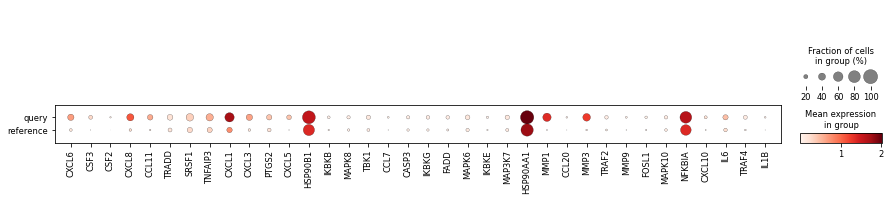

In [93]:
sc.pl.dotplot(oral,var_names=KEGG_IL17,groupby='reference_vs_query')

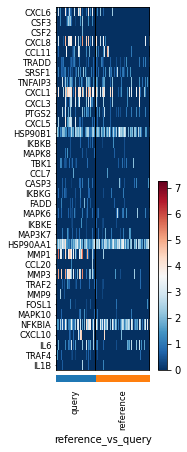

In [94]:
sc.pl.heatmap(oral,var_names=KEGG_IL17,groupby='reference_vs_query',swap_axes=True,cmap='RdBu_r',figsize=(2,7))

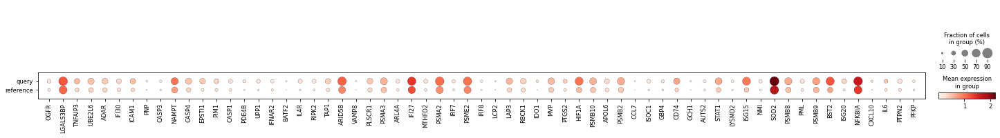

In [95]:
sc.pl.dotplot(oral,var_names=MSIGDB_IFN,groupby='reference_vs_query')

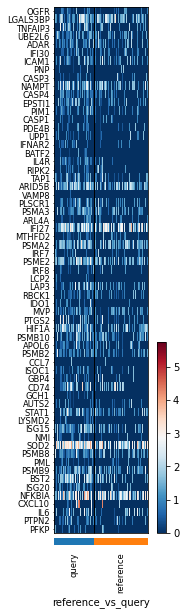

In [96]:
sc.pl.heatmap(oral,var_names=MSIGDB_IFN,groupby='reference_vs_query',swap_axes=True,cmap='RdBu_r',figsize=(2,10),show_gene_labels=True)

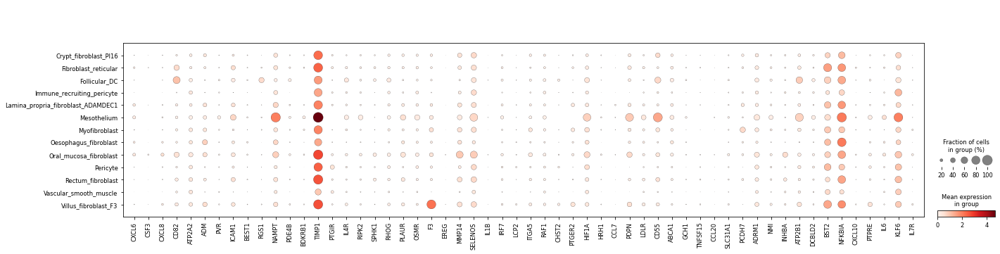

In [97]:
sc.pl.dotplot(adata,var_names=MSIGDB_inflammatory,groupby='level_3_annot')

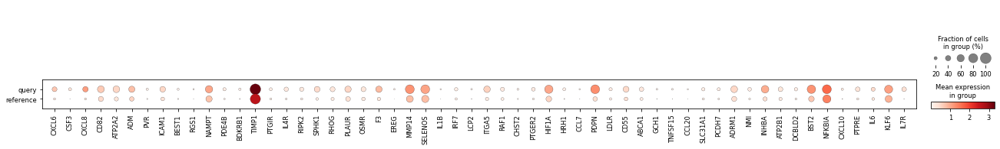

In [98]:
sc.pl.dotplot(oral,var_names=MSIGDB_inflammatory,groupby='reference_vs_query')

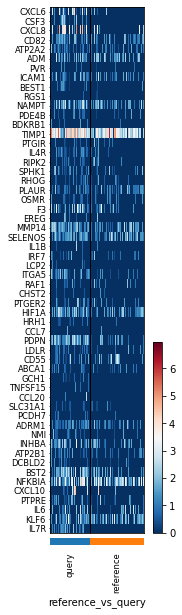

In [99]:
sc.pl.heatmap(oral,var_names=MSIGDB_inflammatory,groupby='reference_vs_query',swap_axes=True,cmap='RdBu_r',figsize=(2,10),show_gene_labels=True)

In [100]:
control_all = adata[adata.obs.disease.isin(['control'])].copy()

In [101]:
disease_all = adata[~adata.obs.disease.isin(['control'])].copy()

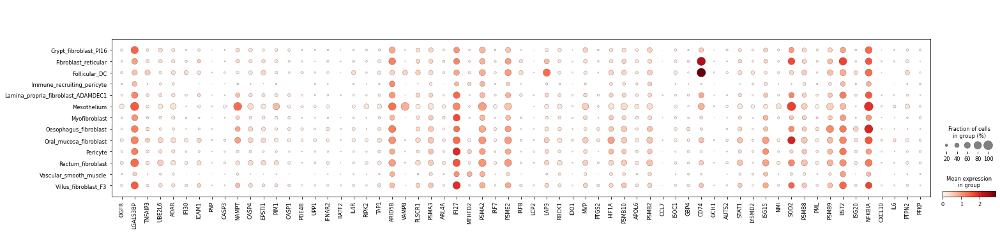

In [102]:
sc.pl.dotplot(disease_all,var_names=MSIGDB_IFN,groupby='level_3_annot')

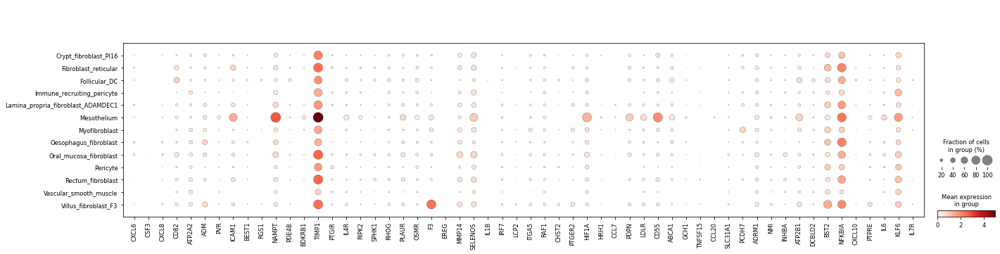

In [103]:
sc.pl.dotplot(control_all,var_names=MSIGDB_inflammatory,groupby='level_3_annot')

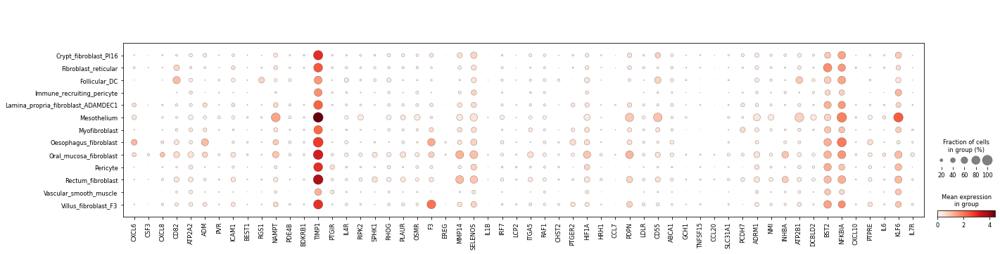

In [104]:
sc.pl.dotplot(disease_all,var_names=MSIGDB_inflammatory,groupby='level_3_annot')

In [105]:
sc.tl.score_genes(disease_all,MSIGDB_inflammatory,score_name = 'MSIGDB_inflammatory_score')

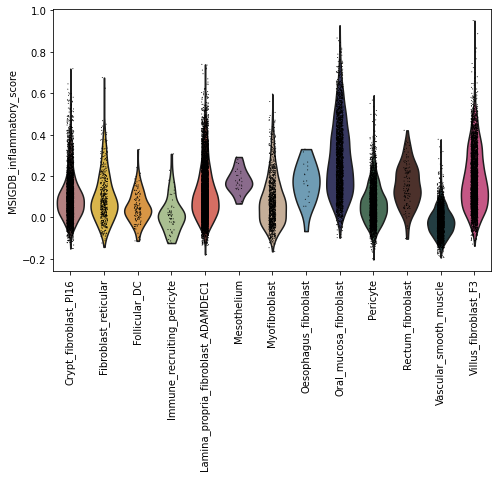

In [106]:
plt.rcParams['figure.figsize'] = [7,5]
sc.pl.violin(disease_all,keys = ['MSIGDB_inflammatory_score'],groupby='level_3_annot',rotation=90)

In [107]:
sc.tl.score_genes(control_all,MSIGDB_inflammatory,score_name = 'MSIGDB_inflammatory_score')

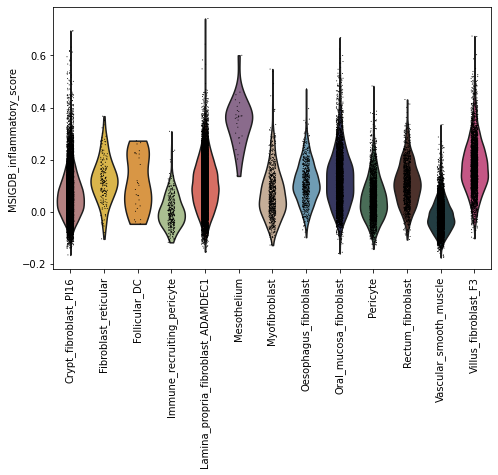

In [108]:
plt.rcParams['figure.figsize'] = [7,5]
sc.pl.violin(control_all,keys = ['MSIGDB_inflammatory_score'],groupby='level_3_annot',rotation=90)

(-0.2, 1.0)

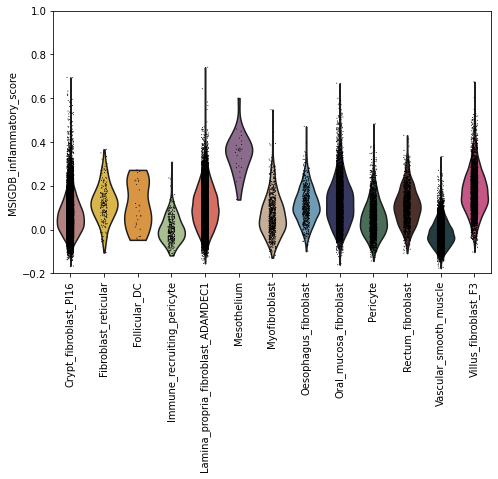

In [109]:
ax = sc.pl.violin(control_all,keys = ['MSIGDB_inflammatory_score'],groupby='level_3_annot',rotation=90, show=False)
ax.set_ylim(bottom=-0.2,top=1)

(-0.2, 1.0)

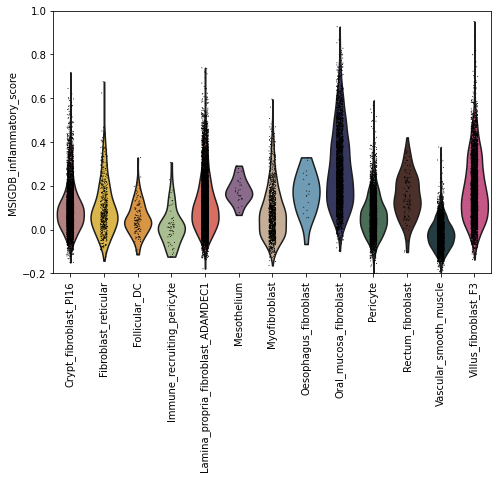

In [110]:
ax = sc.pl.violin(disease_all,keys = ['MSIGDB_inflammatory_score'],groupby='level_3_annot',rotation=90, show=False)
ax.set_ylim(bottom=-0.2,top=1)

In [111]:
ax.figure.savefig('MSIGDB_inflammatory_score_diseasefibro.pdf',bbox_inches='tight')

(-0.2, 1.0)

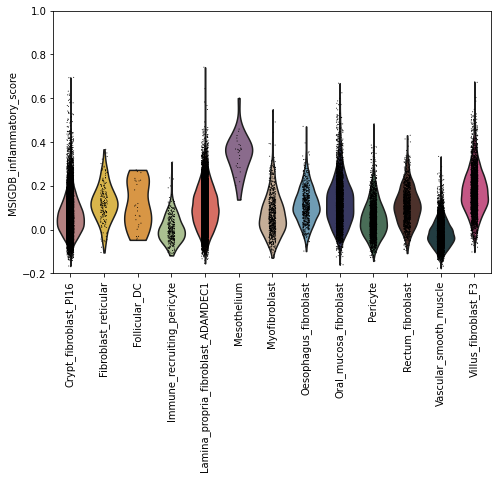

In [112]:
ax = sc.pl.violin(control_all,keys = ['MSIGDB_inflammatory_score'],groupby='level_3_annot',rotation=90, show=False)
ax.set_ylim(bottom=-0.2,top=1)

In [113]:
ax.figure.savefig('MSIGDB_inflammatory_score_healthyfibro.pdf',bbox_inches='tight')

In [114]:
oral_fibro = adata[adata.obs.level_3_annot.isin(['Oral_mucosa_fibroblast'])].copy()

In [115]:
sc.tl.score_genes(oral_fibro,MSIGDB_inflammatory,score_name = 'MSIGDB_inflammatory_score')

In [116]:
oral_fibro.obs['disease'].cat.reorder_categories(['control',

 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD',                               
  'neighbouring_inflammed',
   'neighbouring_polyps',
'cancer_colorectal',
 'cancer_gastric',
'neighbouring_cancer'
   ], inplace=True)


/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


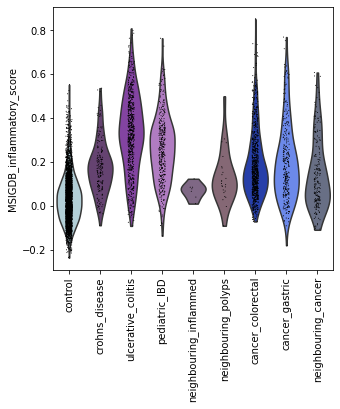

In [117]:
plt.rcParams['figure.figsize'] = [5,5]
ax = sc.pl.violin(oral_fibro,keys = ['MSIGDB_inflammatory_score'],groupby='disease',rotation=90, show=False)

In [118]:
#Save figure - Figure 2e
ax.figure.savefig('MSIGDB_inflammatory_score_oralmucosaFibro_diseasecomparison.pdf',bbox_inches='tight')

In [119]:
oral

AnnData object with n_obs × n_vars = 5213 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [120]:
oral_fibro

AnnData object with n_obs × n_vars = 6781 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [121]:
oral_fibro.obs['reference_vs_query'] = (oral_fibro.obs["disease"].map(lambda x: {
 'control':'reference',
 'neighbouring_cancer':'reference',
 'neighbouring_polyps':'reference',
 'neighbouring_inflammed':'reference',
 'pediatric_IBD':'query',
 'cancer_colorectal':'query',
 'ulcerative_colitis':'query',
 'crohns_disease':'query',
 'cancer_gastric':'query'
        
         }.get(x, x)).astype("category"))

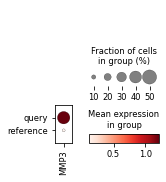

In [122]:
sc.pl.dotplot(oral_fibro,var_names=['MMP3'],groupby='reference_vs_query')

In [123]:
#inflammation associated fibroblast markers based on this recent review: https://www.cell.com/action/showPdf?pii=S0962-8924%2823%2900048-X

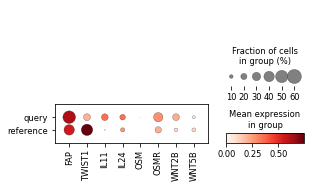

In [124]:
#inflammation associated fibroblasts - resistance to TNF smillie 19 https://pubmed.ncbi.nlm.nih.gov/31348891/
sc.pl.dotplot(oral_fibro,var_names=['FAP', 'TWIST1', 'IL11', 'IL24', 'OSM',
'OSMR', 'WNT2B',
'WNT5B'],groupby='reference_vs_query')

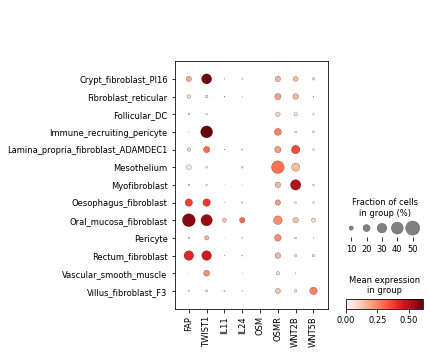

In [125]:
#inflammation associated fibroblasts - resistance to TNF smillie 19 https://pubmed.ncbi.nlm.nih.gov/31348891/
sc.pl.dotplot(adata,var_names=['FAP', 'TWIST1', 'IL11', 'IL24', 'OSM',
'OSMR', 'WNT2B',
'WNT5B'],groupby='level_3_annot')

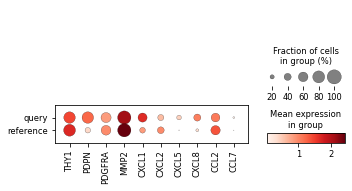

In [126]:
#activated fibroblasts - neutrophil/monocyte recruitment - martin19
sc.pl.dotplot(oral_fibro,var_names=['THY1', 'PDPN',
'PDGFRA',
'MMP2','CXCL1', 'CXCL2',
'CXCL5', 'CXCL8',
'CCL2', 'CCL7'],groupby='reference_vs_query')

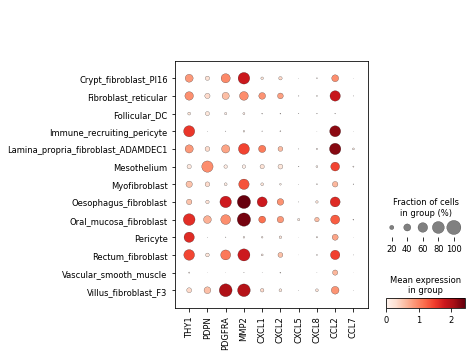

In [127]:
#activated fibroblasts - neutrophil/monocyte recruitment - martin19
sc.pl.dotplot(adata,var_names=['THY1', 'PDPN',
'PDGFRA',
'MMP2','CXCL1', 'CXCL2',
'CXCL5', 'CXCL8',
'CCL2', 'CCL7'],groupby='level_3_annot')

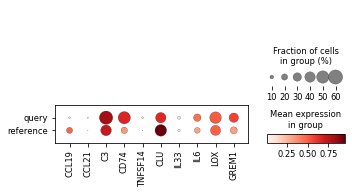

In [128]:
#S4 fibroblasts - Immune modulation, inflammatory response - elmentaite 2020 Dev cell 
sc.pl.dotplot(oral_fibro,var_names=['CCL19',
'CCL21', 'C3',
'CD74', 'TNFSF14', 'CLU',
'IL33', 'IL6', 'LOX',
'GREM1'],groupby='reference_vs_query')

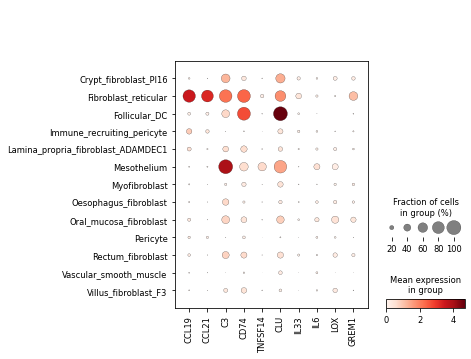

In [129]:
#S4 fibroblasts - Immune modulation, inflammatory response - elmentaite 2020 Dev cell and Kinchen
sc.pl.dotplot(adata,var_names=['CCL19',
'CCL21', 'C3',
'CD74', 'TNFSF14', 'CLU',
'IL33', 'IL6', 'LOX',
'GREM1'],groupby='level_3_annot')

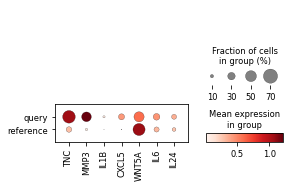

In [130]:
#Inflammatory fibroblasts - Immune modulation, inflammatory response - huang 2019 cell
sc.pl.dotplot(oral_fibro,var_names=['TNC', 'MMP3', 'IL1B', 'CXCL5',
'WNT5A', 'IL6', 'IL24'],groupby='reference_vs_query')

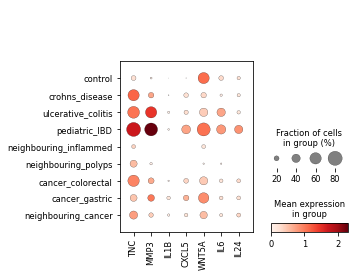

In [131]:
#Inflammatory fibroblasts - Immune modulation, inflammatory response - huang 2019 cell
sc.pl.dotplot(oral_fibro,var_names=['TNC', 'MMP3', 'IL1B', 'CXCL5',
'WNT5A', 'IL6', 'IL24'],groupby='disease')

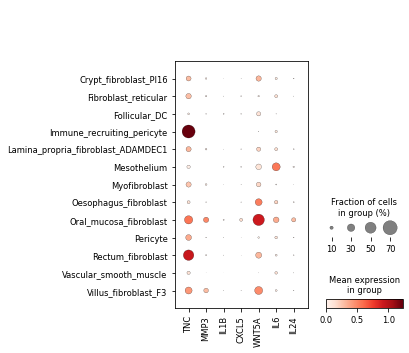

In [132]:
#Inflammatory fibroblasts - Immune modulation, inflammatory response - huang 2019 cell
sc.pl.dotplot(adata,var_names=['TNC', 'MMP3', 'IL1B', 'CXCL5',
'WNT5A', 'IL6', 'IL24'],groupby='level_3_annot')

In [133]:
IAF_markers = {'Smillie2019':['FAP', 'TWIST1', 'IL11', 'IL24', 'OSM',
'OSMR', 'WNT2B',
'WNT5B'],
              'Martin2019':['THY1', 'PDPN',
'PDGFRA',
'MMP2','CXCL1', 'CXCL2',
'CXCL5', 'CXCL8',
'CCL2', 'CCL7'],
              'Elmentaite2020':['CCL19',
'CCL21', 'C3',
'CD74', 'TNFSF14', 'CLU',
'IL33', 'IL6', 'LOX',
'GREM1'],
               'Huang2019':['TNC', 'MMP3', 'IL1B', 'CXCL5',
'WNT5A', 'IL6', 'IL24']
              }

In [134]:
adata.X.max()

8.750056

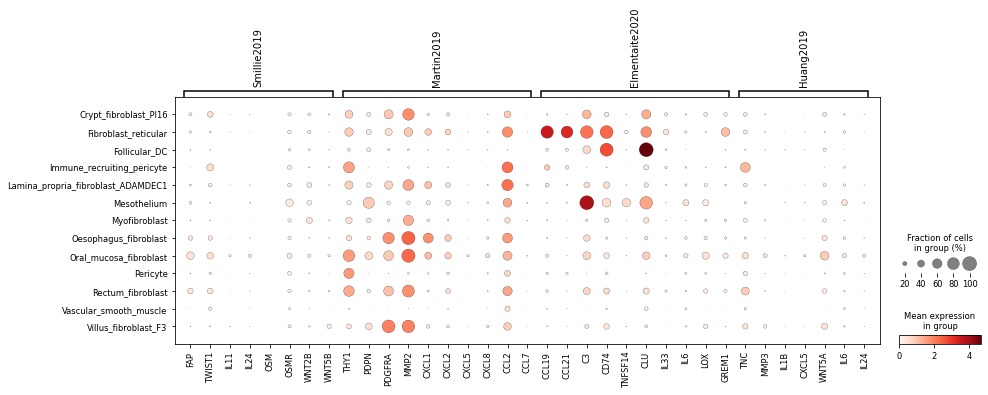

In [135]:
#Inflammatory fibroblasts - Immune modulation, inflammatory response - huang 2019 cell
sc.pl.dotplot(adata,var_names=IAF_markers,groupby='level_3_annot')

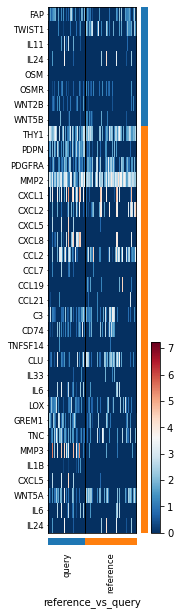

In [136]:
sc.pl.heatmap(oral,var_names=IAF_markers,groupby='reference_vs_query',swap_axes=True,cmap='RdBu_r',figsize=(2,10),show_gene_labels=True)

In [137]:
oral_fibro.obs['disease'].cat.reorder_categories(['control',
                                                  'neighbouring_inflammed',
   'neighbouring_polyps',

 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD',                               
  
'cancer_colorectal',
 'cancer_gastric',
'neighbouring_cancer'
   ], inplace=True)


/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


In [138]:
IAF_markers = {'Smillie2019':[#'FAP', 'TWIST1', 
    'IL11', 'IL24', 'OSM',
'OSMR', 'WNT2B',
'WNT5B'],
              'Martin2019':[#'THY1', 'PDPN','PDGFRA','MMP2',
                  'CXCL1', 'CXCL2',
'CXCL5', 'CXCL8',
'CCL2', 'CCL7'],
              'Elmentaite2020/Kinchen2018':[#'CCL19','CCL21', 'C3','CD74', 
                  'TNFSF14', 'CLU',
'IL33', 'IL6', 'LOX',
'GREM1'],
               'Huang2019':['MMP3', 
                   'IL1B', 'CXCL5',
'WNT5A', 'IL6', 'IL24']
              }

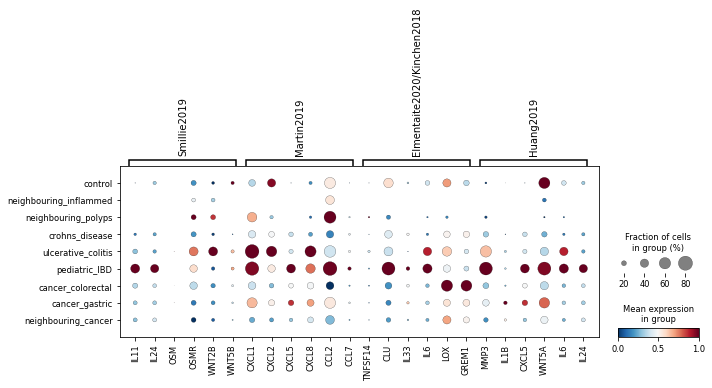

In [139]:
sc.pl.dotplot(oral_fibro,var_names=IAF_markers,groupby='disease',color_map='RdBu_r', standard_scale='var')

In [140]:
oral_fibro.obs['reference_vs_query'].cat.reorder_categories(['reference','query'
   ], inplace=True)

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


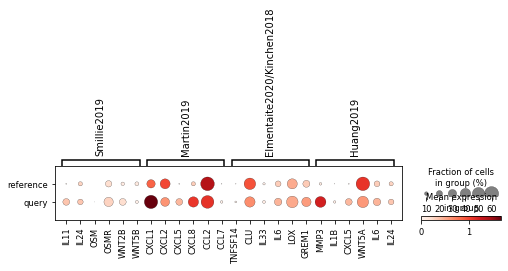

In [141]:
#Save figure - Extended data 4e
sc.pl.dotplot(oral_fibro,var_names=IAF_markers,groupby='reference_vs_query',figsize=(8,1),save='IAFmarker_dotplot.pdf')

In [142]:
IAF_markers_scoring = ['IL11', 'IL24', 'OSM',
'OSMR', 'WNT2B',
'WNT5B','CXCL1', 'CXCL2',
'CXCL5', 'CXCL8',
'CCL2', 'CCL7', 'TNFSF14', 'CLU',
'IL33', 'IL6', 'LOX',
'GREM1', 'IL1B', 'CXCL5',
'WNT5A', 'IL6', 'IL24']

In [143]:
sc.tl.score_genes(oral_fibro,IAF_markers_scoring,score_name ='IAF_marker_score')

In [144]:
oral_fibro.obs['disease'].cat.reorder_categories(['control',
                                                  

 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD', 
                                                  'neighbouring_inflammed',
   'neighbouring_polyps',
  
'cancer_colorectal',
 'cancer_gastric',
'neighbouring_cancer'
   ], inplace=True)

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


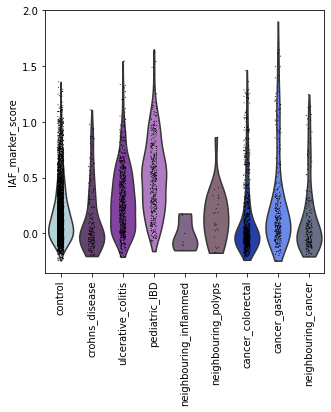

In [145]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.violin(oral_fibro,keys = ['IAF_marker_score'],groupby='disease',rotation=90, show=False)

In [146]:
#Save figure - Extended data 4i
sc.pl.violin(oral_fibro,keys = ['IAF_marker_score'],groupby='disease',rotation=90, show=False,save='OralFibroblasts_IAF_marker_score.pdf')

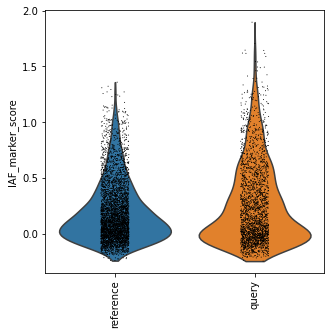

In [147]:
ax = sc.pl.violin(oral_fibro,keys = ['IAF_marker_score'],groupby='reference_vs_query',rotation=90, show=False)

In [148]:
oral_fibro.obs['organ_unified'].value_counts()

gingival mucosa     3158
colon               1016
ileum                599
stomach              451
sigmoid colon        401
caecum               390
rectum               375
periodontium         140
buccal mucosa        106
ascending colon       64
salivary gland        43
oesophagus            14
transverse colon      12
duodenum               7
jejunum                4
descending colon       1
Name: organ_unified, dtype: int64

In [149]:
oral_fibro.obs['organ_unified'].cat.reorder_categories([
    
    'periodontium','gingival mucosa','buccal mucosa',
'salivary gland','oesophagus','stomach','duodenum','jejunum','ileum',
'caecum',
'ascending colon','transverse colon','descending colon',
'sigmoid colon','rectum','colon'], inplace=True)


/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


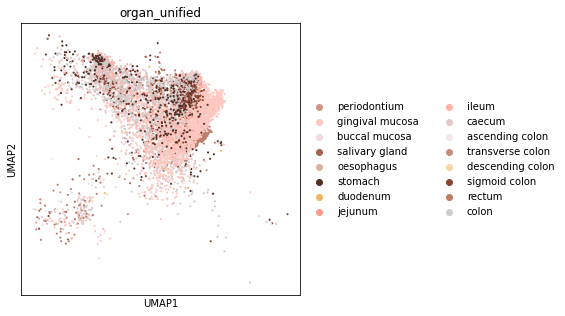

In [150]:
sc.pl.umap(oral_fibro,color='organ_unified',palette={'periodontium': '#f4e7e7',
  'gingival mucosa': '#eedbdb',
  'buccal mucosa': '#e3c9c9',
  'salivary gland': '#cecbcb',
  'oesophagus': '#f9d4a7',
  'stomach': '#edb75f',
  'duodenum': '#fec8c1',
  'jejunum': '#feb2a8',
  'ileum': '#fc9a8d',
  
  'caecum': '#deb0a4',
  'ascending colon': '#cf9686',
  'transverse colon': '#bd7c68',
  'descending colon': '#a36352',
  'sigmoid colon': '#874533',
  'rectum': '#522e25',
  
  'colon': '#c28e80',})

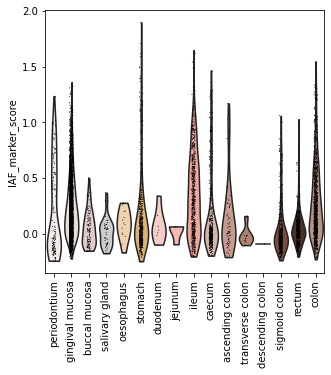

In [151]:
ax = sc.pl.violin(oral_fibro,keys = ['IAF_marker_score'],groupby='organ_unified',rotation=90, show=False)

In [152]:
adata.obs["disease"]

index
AAGCATCCACTCCACT-GSM4600896           control
AATGCCACAGAAACCG-GSM4600896           control
AATGGAATCGGCTGAC-GSM4600896           control
AATGGCTCACTGCTTC-GSM4600896           control
ACCAACAGTTTGAAAG-GSM4600896           control
                                    ...      
TTTCCTCAGAATCTCC-GSM4546346    cancer_gastric
TTTGCGCCACAACGCC-GSM4546346    cancer_gastric
TTTGCGCGTCTCATCC-GSM4546346    cancer_gastric
TTTGGTTGTCAGCTAT-GSM4546346    cancer_gastric
TTTGTCAGTGGTGTAG-GSM4546346    cancer_gastric
Name: disease, Length: 77050, dtype: category
Categories (9, object): ['cancer_colorectal', 'cancer_gastric', 'control', 'crohns_disease', ..., 'neighbouring_inflammed', 'neighbouring_polyps', 'pediatric_IBD', 'ulcerative_colitis']

In [153]:
adata.obs['reference_vs_query'] = (adata.obs["disease"].map(lambda x: {
 'control':'reference',
 'neighbouring_cancer':'reference',
 'neighbouring_polyps':'reference',
 'neighbouring_inflammed':'reference',
 'pediatric_IBD':'query',
 'cancer_colorectal':'query',
 'ulcerative_colitis':'query',
 'crohns_disease':'query',
 'cancer_gastric':'query'
        
         }.get(x, x)).astype("category"))

In [154]:
sc.tl.score_genes(adata,IAF_markers_scoring,score_name ='IAF_marker_score')

In [155]:
adata.obs['celltype_refvquery'] = adata.obs['level_3_annot'].astype(str) + '_' + adata.obs['reference_vs_query'].astype(str)

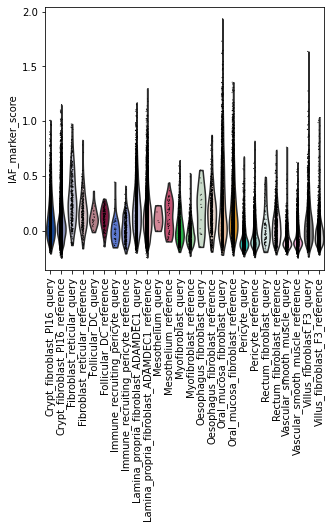

In [156]:
ax = sc.pl.violin(adata,keys = ['IAF_marker_score'],groupby='celltype_refvquery',rotation=90, show=False)

In [157]:
list(adata.obs['level_3_annot'].unique())

['Crypt_fibroblast_PI16',
 'Vascular_smooth_muscle',
 'Lamina_propria_fibroblast_ADAMDEC1',
 'Pericyte',
 'Oral_mucosa_fibroblast',
 'Rectum_fibroblast',
 'Villus_fibroblast_F3',
 'Immune_recruiting_pericyte',
 'Oesophagus_fibroblast',
 'Fibroblast_reticular',
 'Follicular_DC',
 'Myofibroblast',
 'Mesothelium']

In [158]:
adata.obs['celltype_refvquery'].cat.reorder_categories([
'Crypt_fibroblast_PI16_reference',
'Crypt_fibroblast_PI16_query',
     'Fibroblast_reticular_reference',
     'Fibroblast_reticular_query',
     'Follicular_DC_reference',
     'Follicular_DC_query',
    'Immune_recruiting_pericyte_reference',
    'Immune_recruiting_pericyte_query',
    
    'Lamina_propria_fibroblast_ADAMDEC1_reference',
    'Lamina_propria_fibroblast_ADAMDEC1_query',
     'Mesothelium_reference',
     'Mesothelium_query',
     'Myofibroblast_reference',
     'Myofibroblast_query',
    'Oesophagus_fibroblast_reference',
    'Oesophagus_fibroblast_query',
    'Oral_mucosa_fibroblast_reference',
    'Oral_mucosa_fibroblast_query',
     'Pericyte_reference',
     'Pericyte_query',
     'Rectum_fibroblast_reference',
     'Rectum_fibroblast_query',
    
 'Vascular_smooth_muscle_reference',
     'Vascular_smooth_muscle_query',

 'Villus_fibroblast_F3_reference',
     'Villus_fibroblast_F3_query',
 
 



], inplace=True)

/home/jovyan/my-conda-envs/standard_plot_gsea/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


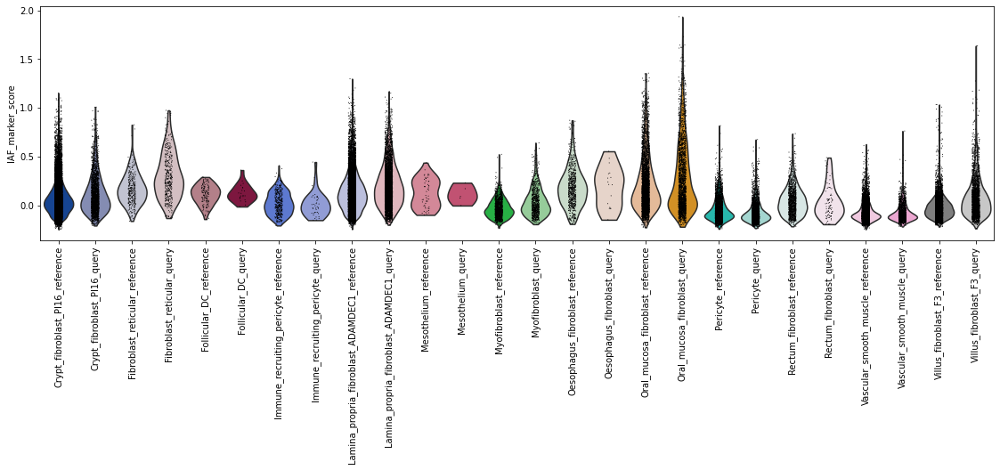

In [159]:
plt.rcParams['figure.figsize'] = [15,5]
sc.pl.violin(adata,keys = ['IAF_marker_score'],groupby='celltype_refvquery',rotation=90, show=False)

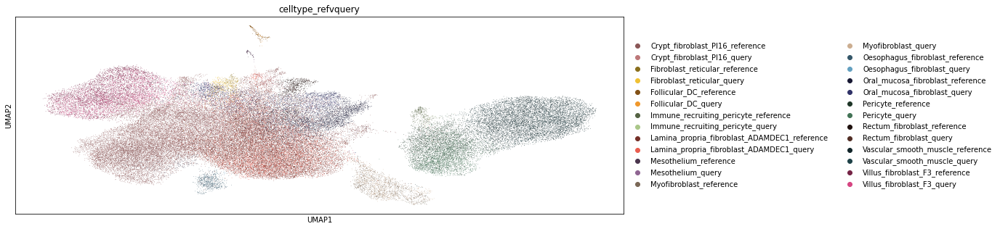

In [160]:
sc.pl.umap(adata,color='celltype_refvquery',palette=[
    
   '#bd7879','#8a5757',
   '#f0c134','#8a6f1d',

  
'#f0982c','#825217',
      '#AAC789','#556344',
    '#e95e50','#752f28',
'#8F6592','#4b354d',
'#CCAE91','#7a6857',
    '#63A0C0','#355769',
'#303267','#171833',
  
 '#437356','#1f3628',
    
 
    
      '#522e25','#1f110e',
'#1E4147','#112529',
     '#d64582','#752446'
     
])

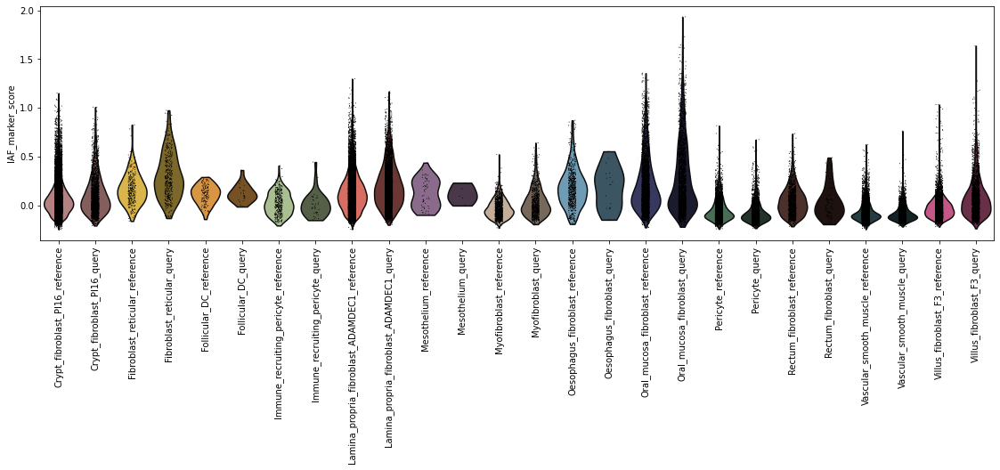

In [161]:
plt.rcParams['figure.figsize'] = [15,5]
sc.pl.violin(adata,keys = ['IAF_marker_score'],groupby='celltype_refvquery',rotation=90, show=False)

In [162]:
adata

AnnData object with n_obs × n_vars = 77050 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

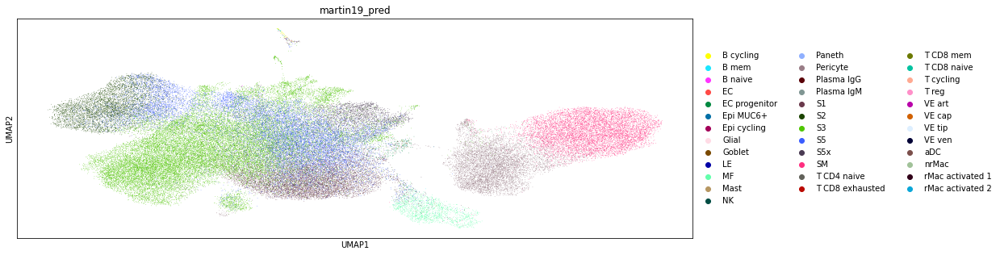

In [163]:
sc.pl.umap(adata,color='martin19_pred')

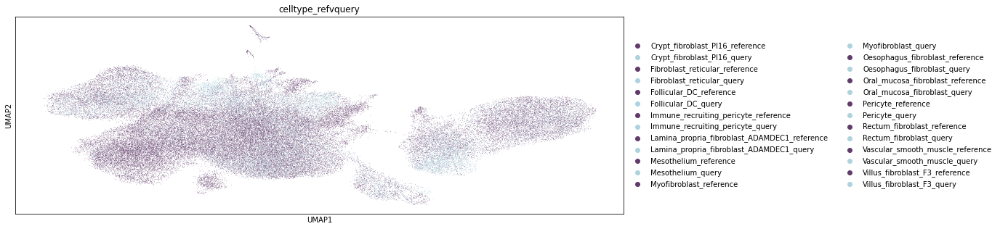

In [164]:
sc.pl.umap(adata,color='celltype_refvquery',palette=[
    
   '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
     '#ADD3DD','#613c6b',
    
    
     
])

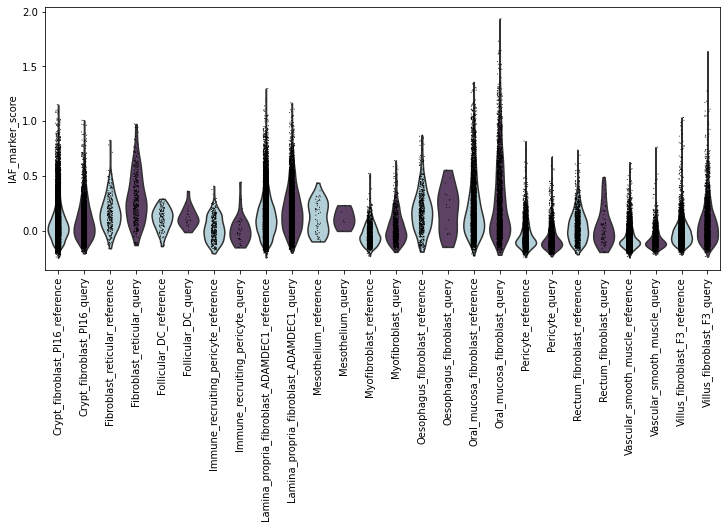

In [165]:
plt.rcParams['figure.figsize'] = [10,5]
sc.pl.violin(adata,keys = ['IAF_marker_score'],groupby='celltype_refvquery',rotation=90, show=False)

In [166]:
plt.rcParams['figure.figsize'] = [10,5]
sc.pl.violin(adata,keys = ['IAF_marker_score'],groupby='celltype_refvquery',rotation=90, show=False,save='OralFibroblasts_IAF_marker_score_bycelltype.pdf')

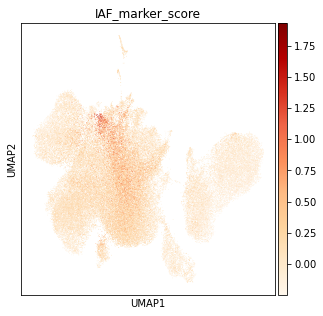

In [167]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='IAF_marker_score',cmap='OrRd')

In [168]:
sc.tl.score_genes(adata,MSIGDB_inflammatory,score_name = 'MSIGDB_inflammatory_score')

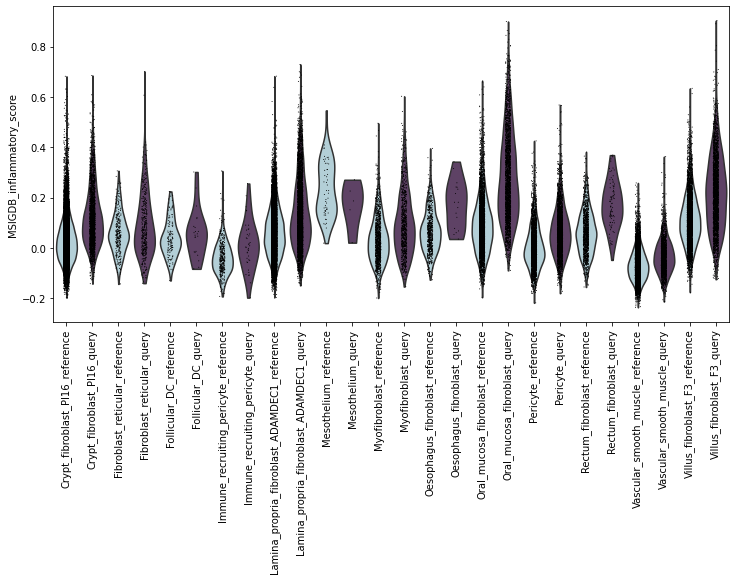

In [169]:
plt.rcParams['figure.figsize'] = [10,6]
sc.pl.violin(adata,keys = ['MSIGDB_inflammatory_score'],groupby='celltype_refvquery',rotation=90, show=False)

In [170]:
sc.set_figure_params(
    dpi=300,dpi_save=600,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [171]:
import seaborn as sns
sns.set_style(style="white")
sns.set_context(context="paper")

In [172]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [173]:
#Save figure - Extended data 4j
sc.pl.violin(adata,keys = ['MSIGDB_inflammatory_score'],groupby='celltype_refvquery',rotation=90, show=False,save='MSIGDB_inflam_score_fibro_all_refvsquery.pdf')

In [174]:
sc.pl.violin(adata,keys = ['MSIGDB_inflammatory_score'],groupby='celltype_refvquery',rotation=90, show=False,save='MSIGDB_inflam_score_fibro_all_refvsquery.png')

In [175]:
oral_fibro

AnnData object with n_obs × n_vars = 6781 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

In [176]:
oral_fibro.obs['organ_unified'].value_counts()

gingival mucosa     3158
colon               1016
ileum                599
stomach              451
sigmoid colon        401
caecum               390
rectum               375
periodontium         140
buccal mucosa        106
ascending colon       64
salivary gland        43
oesophagus            14
transverse colon      12
duodenum               7
jejunum                4
descending colon       1
Name: organ_unified, dtype: int64

In [177]:
#remove descending colon (only has 1 cell)
oral_fibro_dendro = oral_fibro[~oral_fibro.obs.organ_unified.isin(['descending colon','duodenum','jejunum'])].copy()

In [178]:
oral_fibro_dendro

AnnData object with n_obs × n_vars = 6769 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spli

         Falling back to preprocessing with `sc.pp.pca` and default params.


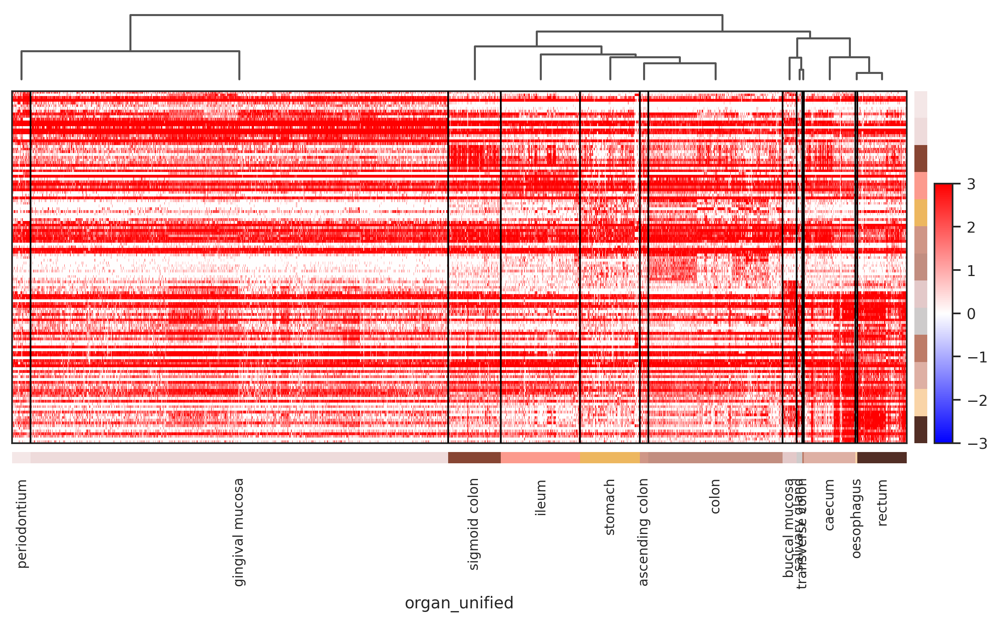

In [179]:
#dendrogram
sc.tl.rank_genes_groups(oral_fibro_dendro,groupby='organ_unified',method='wilcoxon')
sc.tl.dendrogram(oral_fibro_dendro, groupby='organ_unified')
sc.pl.rank_genes_groups_heatmap(oral_fibro_dendro,groupby='organ_unified', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

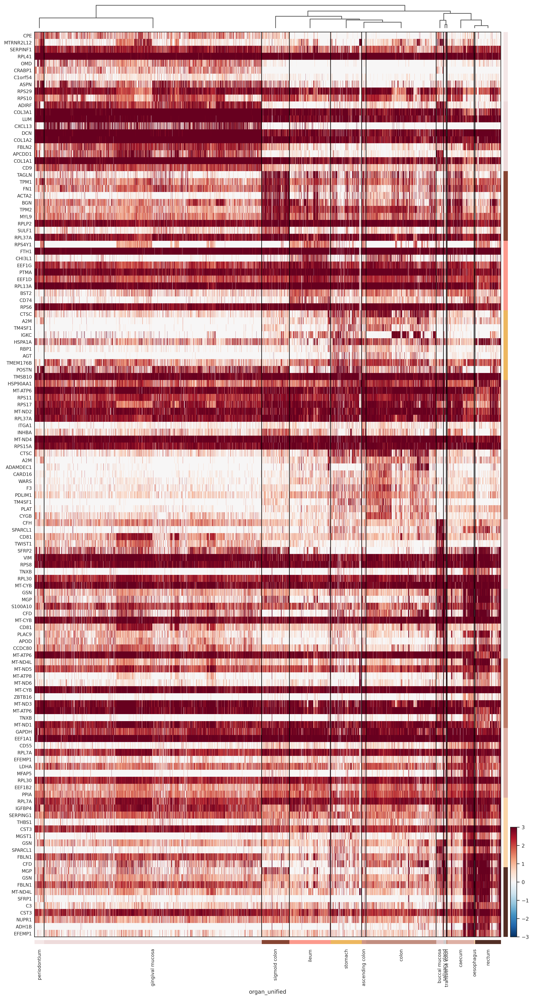

In [180]:
sc.pl.rank_genes_groups_heatmap(oral_fibro_dendro,groupby='organ_unified', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=True,
                                vmin=-3, vmax=3, cmap='RdBu_r',figsize=(15,30))

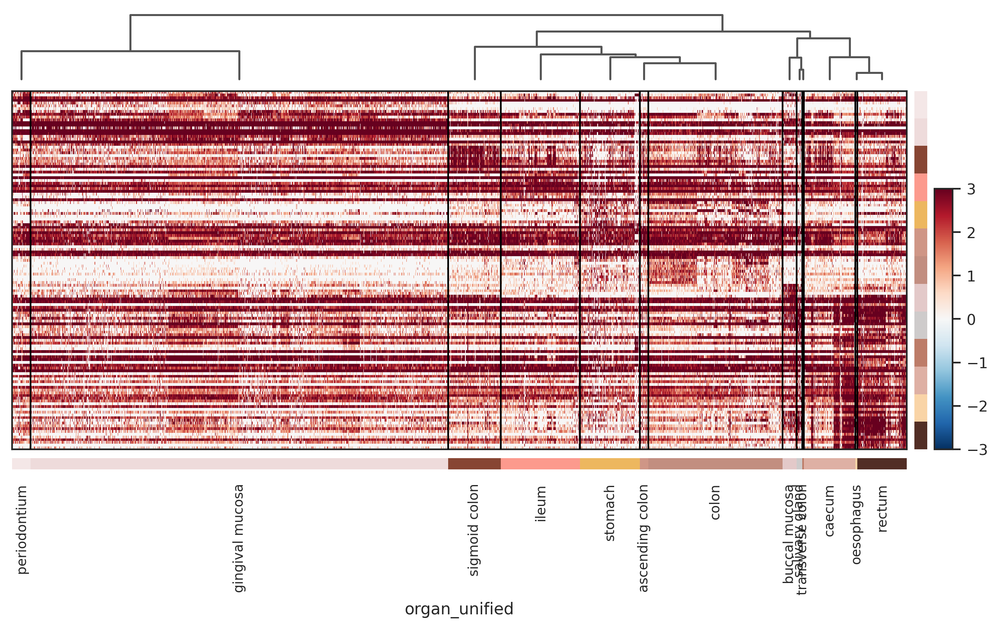

In [181]:
#Save figure - Extended data 4g
sc.pl.rank_genes_groups_heatmap(oral_fibro_dendro,groupby='organ_unified', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='RdBu_r',figsize=(10,5),save='oral_fibro_dendrogram_byoran_unified.pdf')